<font color='black' size='4' face='Tenor Sans'>

## 1.❗About Dataset
<a id="about-dataset"></a>

    Problem Statement
    You are working as a data scientist in a global finance company. Over the years, the company has collected basic bank details and gathered a lot of credit-related information. The management wants to build an intelligent system to segregate the people into credit score brackets to reduce the manual efforts.

    Task
    Given a person’s credit-related information, build a machine learning model that can classify the credit score.

<font color='black' size='2' face='Tenor Sans'>

<a id="preparation"></a>
## 2. 🚩 Preparation

<a id="import-libraries"></a>
## 2.1 📔 Import Libraries

In [1]:
import numpy as np
import pandas as pd 
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, mean_squared_error
from imblearn.over_sampling import SMOTE
from xgboost import XGBRegressor
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

<a id="loading-files"></a>
## 2.2 🗃️ Loading Files
<font color='black' size='2' face='Sans Serif'>

In [2]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [3]:
train = pd.read_csv('credit_train.csv', dtype={'Column26': str})
train.head(1)

C:\Users\MyAsus\AppData\Local\Temp\ipykernel_19912\2000653539.py:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  train = pd.read_csv('credit_train.csv', dtype={'Column26': str})


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.82262,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good


<a id="data-cleaning"></a>
## 3.🧹 Data Cleaning

In [4]:
# Looks like a lot of data not in the right format. Let's fix it!

train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

    There are a lot of missplaced symbols not related to data which will affect training model. Let's do some magic to adjust form

<a id="adjust-data-format"></a>
## 3.1 📚 Adjust Data Format (+ Entry)

    Age / Loans / Delayed Payments


In [5]:
# That's a tricky one. I loop with extending code, so it solve Data Entry and Data Format issues at once. 

train['Age'] = train['Age'].fillna('0').str.extract('(\d+)').astype(float).astype(int)
train['Num_of_Loan'] = train['Num_of_Loan'].fillna('0').str.extract('(\d+)').astype(float).astype(int)
train['Num_of_Delayed_Payment'] = train['Num_of_Delayed_Payment'].fillna('0').str.extract('(\d+)').astype(float).astype(int)

    Annual Income

In [6]:
train['Annual_Income'] = train['Annual_Income'].str.replace(r'[^0-9.]', '', regex=True)
train['Annual_Income'] = train['Annual_Income'].astype(float)

    Credit Limit

In [7]:
# Each column has it's own 'thing', which keep showing me errors. So I will step by step get rid of mistakes until achieving appropriate conditions

train['Changed_Credit_Limit'] = train['Changed_Credit_Limit'].replace('_', np.nan)
train['Changed_Credit_Limit'] = pd.to_numeric(train['Changed_Credit_Limit'], errors='coerce')
train['Changed_Credit_Limit'] = train['Changed_Credit_Limit'].fillna(0)

    Outstanding Debt

In [8]:
# As the previous one, here I am dealing with non-numeric values. Conver them into float, ignoring errors. And replacing NaN values with 0

train['Outstanding_Debt'] = train['Outstanding_Debt'].astype(str)
train['Outstanding_Debt'] = train['Outstanding_Debt'].str.replace(r'[^0-9.]', '', regex=True)
train['Outstanding_Debt'] = pd.to_numeric(train['Outstanding_Debt'], errors='coerce')
train['Outstanding_Debt'] = train['Outstanding_Debt'].fillna(0)

    Invested Monthly

In [9]:
# Same but handling more errors

train['Amount_invested_monthly'] = train['Amount_invested_monthly'].astype(str)
train['Amount_invested_monthly'] = train['Amount_invested_monthly'].replace('', '0')
train['Amount_invested_monthly'] = train['Amount_invested_monthly'].str.replace(r'[^0-9.]', '')
train['Amount_invested_monthly'] = pd.to_numeric(train['Amount_invested_monthly'], errors='coerce')
train['Amount_invested_monthly'] = train['Amount_invested_monthly'].fillna(0)

    Monthly Balance

In [10]:
train['Monthly_Balance'] = train['Monthly_Balance'].astype(str)
train['Monthly_Balance'] = train['Monthly_Balance'].str.replace(r'[^0-9.-]+', '')
train['Monthly_Balance'] = pd.to_numeric(train['Monthly_Balance'], errors='coerce')
train['Monthly_Balance'] = train['Monthly_Balance'].fillna(0)

    Credit History Age

In [11]:
# Covert Credit History Age into Months for better model construction

def parse_years_and_months(age):
    if isinstance(age, str):
        age_parts = age.split(' Years and ')
        years = int(age_parts[0]) if 'Years' in age else 0 
        months_str = age_parts[1].split(' Months')[0] if 'Months' in age_parts[1] else '0' 
        months = int(months_str)
        total_months = years * 12 + months
        return total_months
    else:
        return 0  

train['Credit_History_Age_Months'] = train['Credit_History_Age'].apply(parse_years_and_months)

<a id="duplicates"></a>
## 3.2 👥 Dublicates

In [12]:
duplicates = train[train.duplicated()]
num_duplicates = duplicates.shape[0]

if num_duplicates == 0:
    print("There are no duplicates 👌")
else:
    print("There are", num_duplicates, "duplicates.")

There are no duplicates 👌


## 3.3 ⚖️ Data Scaling
<a id="data-scaling"></a>


In [13]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,100000.0,1.195097e+02,6.847573e+02,1.400000e+01,25.000000,34.000000,42.000000,8.698000e+03
Annual_Income,100000.0,1.764157e+05,1.429618e+06,7.005930e+03,19457.500000,37578.610000,72790.920000,2.419806e+07
Monthly_Inhand_Salary,84998.0,4.194171e+03,3.183686e+03,3.036454e+02,1625.568229,3093.745000,5957.448333,1.520463e+04
Num_Bank_Accounts,100000.0,1.709128e+01,1.174048e+02,-1.000000e+00,3.000000,6.000000,7.000000,1.798000e+03
Num_Credit_Card,100000.0,2.247443e+01,1.290574e+02,0.000000e+00,4.000000,5.000000,7.000000,1.499000e+03
Interest_Rate,100000.0,7.246604e+01,4.664226e+02,1.000000e+00,8.000000,13.000000,20.000000,5.797000e+03
Num_of_Loan,100000.0,1.076196e+01,6.178993e+01,0.000000e+00,2.000000,3.000000,6.000000,1.496000e+03
Delay_from_due_date,100000.0,2.106878e+01,1.486010e+01,-5.000000e+00,10.000000,18.000000,28.000000,6.700000e+01
Num_of_Delayed_Payment,100000.0,2.877941e+01,2.181148e+02,0.000000e+00,8.000000,13.000000,18.000000,4.397000e+03
Changed_Credit_Limit,100000.0,1.017179e+01,6.880628e+00,-6.490000e+00,4.970000,9.250000,14.660000,3.697000e+01


In [14]:
# Removing rediculous top outliers (2%)

selected_columns_train = train[['Num_Bank_Accounts', 'Interest_Rate', 'Annual_Income', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Total_EMI_per_month', 'Num_of_Loan', 'Num_Credit_Card']]

percentile_threshold = 0.98
percentiles = selected_columns_train.quantile(percentile_threshold)

for column in selected_columns_train.columns:
    train = train[train[column] <= percentiles[column]]

In [15]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,85806.0,1.204860e+02,6.900675e+02,1.400000e+01,25.000000,34.000000,42.000000,8698.000000
Annual_Income,85806.0,4.937862e+04,3.647839e+04,7.005930e+03,19294.460000,36780.030000,70825.760000,166837.640000
Monthly_Inhand_Salary,72894.0,4.105781e+03,3.036319e+03,3.036454e+02,1623.778333,3069.091667,5899.970000,14131.123333
Num_Bank_Accounts,85806.0,5.372759e+00,2.585031e+00,-1.000000e+00,3.000000,6.000000,7.000000,10.000000
Num_Credit_Card,85806.0,5.779048e+00,5.727016e+00,0.000000e+00,4.000000,5.000000,7.000000,171.000000
Interest_Rate,85806.0,1.455117e+01,8.824173e+00,1.000000e+00,7.000000,13.000000,20.000000,128.000000
Num_of_Loan,85806.0,7.318381e+00,1.888167e+01,0.000000e+00,2.000000,3.000000,6.000000,100.000000
Delay_from_due_date,85806.0,2.103348e+01,1.478622e+01,-5.000000e+00,10.000000,18.000000,28.000000,67.000000
Num_of_Delayed_Payment,85806.0,1.234832e+01,6.845002e+00,0.000000e+00,8.000000,13.000000,18.000000,25.000000
Changed_Credit_Limit,85806.0,1.018960e+01,6.867078e+00,-6.490000e+00,4.990000,9.280000,14.710000,36.970000


    That looks quite pretty ✅

<a id="data-entry"></a>
## 3.4 👾 Data Entry Plus

## 3.4.1 🗑️ Filtering trash
<a id="filtering-trash"></a>

In [16]:
train = train[train['Payment_Behaviour'] != '!@9#%8']

In [17]:
# Drop the rows containing the value '_______' in the 'Occupation' column

train = train[train['Occupation'] != '_______']
print(train['Occupation'].unique())

['Scientist' 'Teacher' 'Engineer' 'Entrepreneur' 'Developer' 'Lawyer'
 'Media_Manager' 'Doctor' 'Journalist' 'Manager' 'Accountant' 'Musician'
 'Mechanic' 'Writer' 'Architect']


In [18]:
# Drop rows where 'Credit_Mix' is '_'

train = train[train['Credit_Mix'] != '_']
print(train['Credit_Mix'].unique())

['Good' 'Standard' 'Bad']


### 3.4.2 ➖ Negative Values
<a id="negative-values"></a>


In [19]:
# Negative values

selected_columns = ['Delay_from_due_date', 'Changed_Credit_Limit', 'Num_Bank_Accounts']

for column in selected_columns:
    train = train[train[column] >= 0]

## 3.4.2 🚮 Dropping Columns
<a id="dropping-columns"></a>

In [20]:
# Not useful for trainig model

columns_to_drop = ['ID', 'Customer_ID', 'Month', 'Name', 'SSN', 'Credit_History_Age','Monthly_Inhand_Salary', 'Type_of_Loan']

train.drop(columns=columns_to_drop, inplace=True)

<a id="missing-values"></a>
## 3.5 🕵️ Missing Values

In [21]:
total_missing_values = train.isnull().sum().sum()

if total_missing_values == 0:
    print("There are no missing values 💅")
else:
    print("Total missing values:", total_missing_values)

There are no missing values 💅


## 4.0 🎚️ Feature Engineering
<a id="feature-engineering"></a>

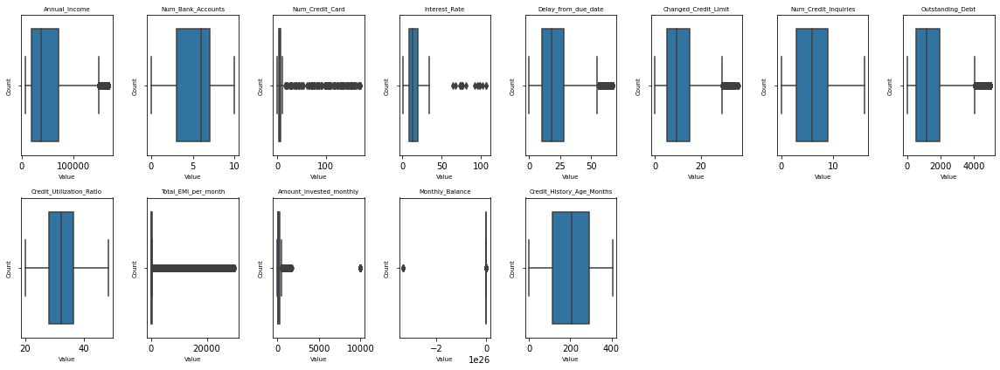

In [22]:
numeric_columns = train.select_dtypes(include=['int64', 'float64']).columns

num_columns = 8
num_rows = (len(numeric_columns) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, 6))

axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.boxplot(x=train[column], ax=axes[i])
    axes[i].set_title(column, fontsize=7)  
    axes[i].set_xlabel('Value', fontsize=7)  
    axes[i].set_ylabel('Count', fontsize=7)  

for j in range(len(numeric_columns), num_columns*num_rows):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

## 4.1 🔢 Scaling 2.0
<a id="scaling-2.0"></a>


In [23]:
# Another step to tune best scale (subjective)

train = train[train['Age'] < 60]
train = train[train['Num_Credit_Card'] <= 10]
train = train[train['Interest_Rate'] <= 50]
train = train[train['Num_of_Loan'] <= 12]
train = train[train['Num_Bank_Accounts'] <= 10]
train = train[train['Delay_from_due_date'] <= 60]
train = train[train['Changed_Credit_Limit'] <= 30]
train = train[train['Num_Credit_Inquiries'] <= 12]
train = train[train['Total_EMI_per_month'] <= 200]
train = train[train['Outstanding_Debt'] <= 1500]

    KEY 🗝️
    ______________________________________________________________________
    
    Decision was made while making EDA. I looked at the plots and realized, that some outliers are way beyond Standard deviation. The challenge is to choose the right scaling for modeling.
    
    ______________________________________________________________________

## 4.2 🧬 Encoding
<a id="encoding"></a>


## 4.2.1 🏷️ Label Encoder
<a id="label-encoder"></a>

In [24]:
categories = ['Poor', 'Standard', 'Good']

encoder = OrdinalEncoder(categories=[categories])

train['Credit_Score_Encoded'] = encoder.fit_transform(train[['Credit_Score']])

In [25]:
# Encoding Occupation

label_encoder = LabelEncoder()
train['Occupation_Encoded'] = label_encoder.fit_transform(train['Occupation'])

## 4.2.2 🔖 Ordinal Encoder
<a id="ordinal-encoder"></a>


In [26]:
categories = ['Bad', 'Standard', 'Good']

encoder = OrdinalEncoder(categories=[categories])

train['Credit_Mix_Encoded'] = encoder.fit_transform(train[['Credit_Mix']])

In [27]:
categories_payment_behaviour = [
    'Low_spent_Small_value_payments', 
    'Low_spent_Medium_value_payments', 
    'Low_spent_Large_value_payments', 
    'High_spent_Small_value_payments', 
    'High_spent_Medium_value_payments', 
    'High_spent_Large_value_payments'
]

encoder_payment_behaviour = OrdinalEncoder(categories=[categories_payment_behaviour])

train['Payment_Behaviour_Encoded'] = encoder_payment_behaviour.fit_transform(train[['Payment_Behaviour']])

### Dropping Unencoded columns


In [28]:
columns_to_drop = [ 'Payment_Behaviour', 'Credit_Mix', 'Occupation','Credit_Score']
train.drop(columns=columns_to_drop, inplace=True)

## 4.3 ⚙️ New Features
<a id="new-features"></a>


    It might help to increase % of accuracy and reduce amount of errors. 

In [29]:
# Calculate the total number of accounts (Bank Accounts + Credit Cards)

train['Total_Num_Accounts'] = train['Num_Bank_Accounts'] + train['Num_Credit_Card']

# Calculate the total outstanding debt per account

train['Debt_Per_Account'] = train['Outstanding_Debt'] / train['Total_Num_Accounts']

# Calculate the ratio of outstanding debt to annual income

train['Debt_to_Income_Ratio'] = train['Outstanding_Debt'] / train['Annual_Income']

# Calculate the total number of delayed payments per account

train['Delayed_Payments_Per_Account'] = train['Num_of_Delayed_Payment'] / train['Total_Num_Accounts']

# Calculate the total monthly expenses (EMI + Monthly Investments) 

train['Total_Monthly_Expenses'] = train['Total_EMI_per_month'] + train['Amount_invested_monthly']


## 4.4 💯 Mutual Information Score (MI Score)
<a id="mutual-information-score"></a>


    MI Score is a treasure! It will help you to recognize the most valuable variables for the prediction. Cool, right? 

In [30]:
categorical_columns = train.select_dtypes(include=['object']).columns

data_encoded = train.copy()

encoder = OrdinalEncoder()
data_encoded[categorical_columns] = encoder.fit_transform(data_encoded[categorical_columns])

y = data_encoded['Credit_Score_Encoded']
X = data_encoded.drop(columns=['Credit_Score_Encoded'])

mi_scores = mutual_info_classif(X, y)

for i, score in enumerate(mi_scores):
    print(f"Feature '{X.columns[i]}': Mutual Information Score = {score}")

Feature 'Age': Mutual Information Score = 0.005661515568559317
Feature 'Annual_Income': Mutual Information Score = 0.428534021790165
Feature 'Num_Bank_Accounts': Mutual Information Score = 0.06166226755238946
Feature 'Num_Credit_Card': Mutual Information Score = 0.06874417170855396
Feature 'Interest_Rate': Mutual Information Score = 0.09684134028812075
Feature 'Num_of_Loan': Mutual Information Score = 0.01945182418042024
Feature 'Delay_from_due_date': Mutual Information Score = 0.06639317647035958
Feature 'Num_of_Delayed_Payment': Mutual Information Score = 0.04969781452537636
Feature 'Changed_Credit_Limit': Mutual Information Score = 0.10120816732353499
Feature 'Num_Credit_Inquiries': Mutual Information Score = 0.03427838235411462
Feature 'Outstanding_Debt': Mutual Information Score = 0.43065124937485066
Feature 'Credit_Utilization_Ratio': Mutual Information Score = 0.0008940600062685711
Feature 'Payment_of_Min_Amount': Mutual Information Score = 0.07446606835852143
Feature 'Total_EMI

In [31]:
sorted_mi_scores = sorted(zip(X.columns, mi_scores), key=lambda x: x[1], reverse=True)
sorted_columns = [x[0] for x in sorted_mi_scores]
sorted_scores = [x[1] for x in sorted_mi_scores]

colorscale = 'Viridis'  

fig = go.Figure(data=[go.Bar(x=sorted_columns, y=sorted_scores, marker=dict(color=sorted_scores, colorbar=dict(title='Mutual Information Score', len=0.5, y=0.2)))])

fig.update_layout(title='Mutual Information Scores for Each Feature',
                  xaxis_title='Features',
                  yaxis_title='Mutual Information Score')

fig.show()

    KEY 🗝️
    ______________________________________________________________________
    
    Annual Income: With a high Mutual Information Score of 0.430, the annual income appears to be a significant predictor of credit score rate. Generally, individuals with higher annual incomes tend to have better credit scores.

    Outstanding Debt: Another crucial factor is outstanding debt, which has a Mutual Information Score of 0.429. High levels of outstanding debt may negatively impact credit score rates.

    Debt-to-Income Ratio: This feature also demonstrates a high importance with a Mutual Information Score of 0.433. It measures the proportion of a person's debt relative to their income and is a strong indicator of creditworthiness.

    Total EMI per Month: Total Equated Monthly Installment (EMI) obligations carry a substantial weight (Mutual Information Score of 0.349) in predicting credit score rates. Higher EMI commitments might suggest higher financial stress and impact credit scores negatively.

    Interest Rate: While not as high as the debt-related features, the interest rate still holds significant importance with a Mutual Information Score of 0.100. Higher interest rates may indicate riskier borrowing behavior and could negatively influence credit scores.  
    
    ______________________________________________________________________

    ✂️ Dropping low related values for MI Score



In [32]:
# Getting rid of columns which are not important for prediction. Even so we just created new features, some of them seems to be not effective for the model
# I tried to get rid of other columns. However, the prediction accuracy was harmed by that. 

columns_to_drop = [ 'Payment_of_Min_Amount', 'Age', 'Monthly_Balance', 'Total_Monthly_Expenses', 'Payment_Behaviour_Encoded', 'Amount_invested_monthly', 'Credit_Utilization_Ratio', 'Occupation_Encoded']
train.drop(columns=columns_to_drop, inplace=True)

<a id="eda"></a>
## 5. 📊 EDA

## 5.1 🧱 Correlation Matrix
<a id="correlation-matrix"></a>


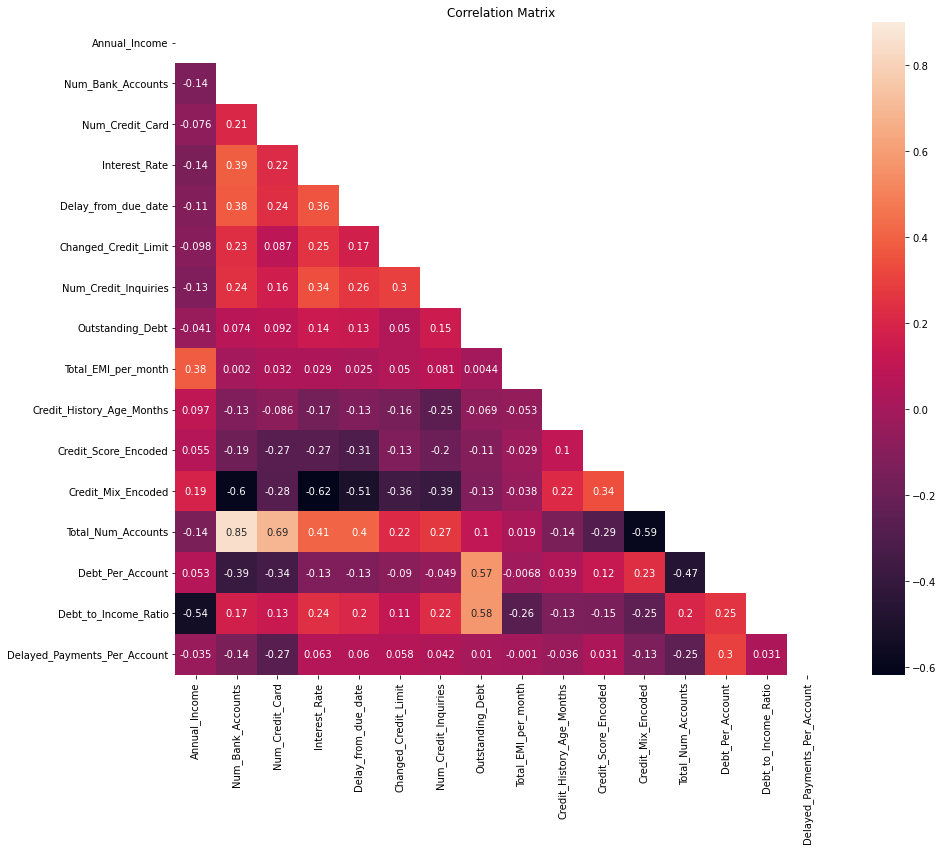

In [33]:
# Calculate Correlation Matrix

corr = train.select_dtypes(include=['float64', 'int64']).corr(method='pearson')
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(16, 12))
sns.heatmap(corr, mask=mask, vmax=0.9, square=True, annot=True)
plt.title('Correlation Matrix')
plt.show()

    KEY 🗝️
    ______________________________________________________________________
    
    Financial Stability Indicators: Features such as 'Annual_Income', 'Num_Bank_Accounts', 'Num_Credit_Card', and 'Total_Num_Accounts' demonstrate positive correlations with each other and with the Credit score. This suggests that individuals with higher annual incomes or more diverse banking and credit card accounts tend to have higher credit scores.

    Debt-related Metrics: 'Debt_to_Income_Ratio' and 'Debt_Per_Account' exhibit negative correlations with the Credit score. This indicates that individuals with higher debt-to-income ratios or greater debt per account tend to have lower credit scores. Furthermore, 'Outstanding_Debt' demonstrates a weaker negative correlation with the credit score, highlighting its impact on overall creditworthiness.

    Credit Utilization and History: 'Total_EMI_per_month', representing monthly loan repayments, shows a positive correlation with the Credit score. Additionally, features related to credit history, such as 'Credit_History_Age_Months' and 'Credit_Mix_Encoded", suggests that individuals with longer credit histories, diverse credit accounts, and timely repayments tend to have higher credit scores.

    Loan-related Factors: Features like 'Num_of_Loan' and 'Num_of_Delayed_Payment' indicate an individual's borrowing behavior and repayment patterns. This implies that individuals with fewer loan accounts or instances of delayed payments are more likely to have higher Credit scores.

    Interest Rate and Financial Behavior: 'Interest_Rate' reveals a relationship with the Credit score, suggesting that individuals with lower Interest rates on their loans may have higher Credit scores. Moreover, 'Changed_Credit_Limit' and 'Num_Credit_Inquiries' also exhibit correlations, reflecting changes in credit limits and the frequency of credit inquiries, respectively.
    
    ______________________________________________________________________

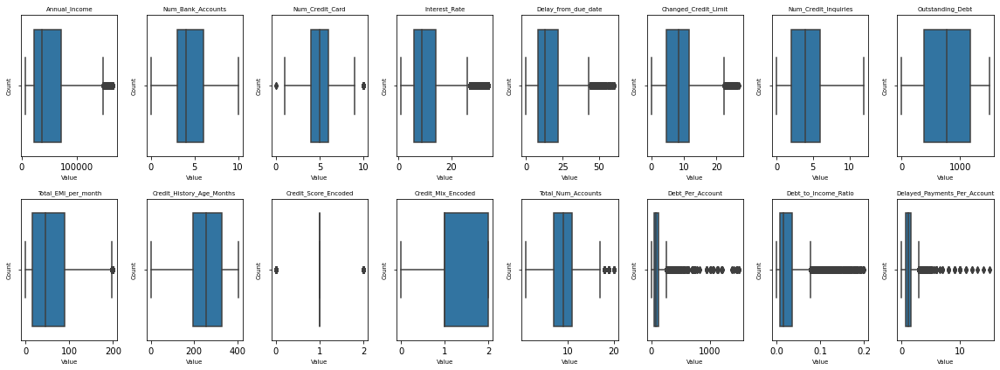

In [34]:
numeric_columns = train.select_dtypes(include=['int64', 'float64']).columns

num_columns = 8
num_rows = (len(numeric_columns) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(16, 6))

axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.boxplot(x=train[column], ax=axes[i])
    axes[i].set_title(column, fontsize=7)  
    axes[i].set_xlabel('Value', fontsize=7)  
    axes[i].set_ylabel('Count', fontsize=7)  

for j in range(len(numeric_columns), num_columns*num_rows):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

    KEY 🗝️  
    ______________________________________________________________________
    
    Let's not Scale New Features. Farther cut only produces more errors and damage accuracy (I've leraned it the hard way...)
    ______________________________________________________________________

## 6. 🧩 Model
<a id="model"></a>


### 6.0.1 🏗️ Buildind a Model
<a id="building-model"></a>


In [35]:
y = train['Credit_Score_Encoded']

X = train[['Annual_Income', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Total_EMI_per_month',
       'Credit_History_Age_Months', 'Credit_Mix_Encoded', 'Total_Num_Accounts', 
       'Debt_Per_Account', 'Debt_to_Income_Ratio', 'Delayed_Payments_Per_Account']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=77)

## 6.1 🧜‍♀️ MSE Model Fashion Show
<a id="mse-models"></a>

## 6.1.1 🌲 RandomForestRegressor
<a id="randomforestregressor"></a>


In [36]:
model = RandomForestRegressor(n_estimators=500, bootstrap=True, random_state=77)
model.fit(X_train, y_train)

RandomForestRegressor(n_estimators=500, random_state=77)

### 6.1.1.1 ✨ Model Validation (MSE)
<a id="validation"></a>

In [37]:
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.1621489922101923


<a id="baseline-vs-mse"></a>
## 6.1.1.2 🎌 Baseline VS MSE

In [38]:
baseline_prediction = y_train.mean()  
baseline_mse = mean_squared_error(y_test, [baseline_prediction] * len(y_test))

print("Baseline MSE:", baseline_mse)
print("MSE RFRegressor", mse)

Baseline MSE: 0.3749730269198414
MSE RFRegressor 0.1621489922101923


<a id="xgboost"></a>
## 6.1.2 🚀 XGBoost

In [39]:
xgb_model = XGBRegressor(n_estimators=3500, learning_rate=0.05, random_state=77)
xgb_model.fit(X_train, y_train)

y_pred_xgb = xgb_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred_xgb)

print("Mean Squared Error (MSE):", mse)

Mean Squared Error (MSE): 0.162767004196021


<a id="comparing-mse"></a>
## 6.1.3 📉 Comparing MSE 

In [40]:
mse_rf = mean_squared_error(y_test, y_pred)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)

models = ['RandomForestRegressor', 'XGBoost']
mse_values = [mse_rf, mse_xgb]
colors = ['blue', 'green']

fig = go.Figure(data=[go.Bar(x=models, y=mse_values, marker_color=colors)])
fig.update_layout(
    title='Comparison of MSE between RandomForestRegressor and XGBoost',
    xaxis_title='Models',
    yaxis_title='Mean Squared Error (MSE)'
)
fig.show()

    KEY 🗝️
    ______________________________________________________________________
    
    Both models show the same MSE rate 🏆
    ______________________________________________________________________

<a id="smote"></a>
## 6.2.1 🔄 SMOTE vs 🌳 ForestClassifier 

In [42]:
smote_params = {
    'sampling_strategy': 'auto',  
    'random_state': 77,           
    'k_neighbors': 5,             
    'n_jobs': -1                  
}

smote = SMOTE(**smote_params)

X_train = train.drop('Credit_Score_Encoded', axis=1) 
y_train = train['Credit_Score_Encoded']

X_smote, y_smote = smote.fit_resample(X_train, y_train)
X_train_smote, X_test_smote, y_train_smote, y_test_smote = train_test_split(X_smote, y_smote, test_size=0.15, random_state=77)


In [117]:
rf_classifier = RandomForestClassifier(n_estimators=500, bootstrap=True)

rf_classifier.fit(X_train_smote, y_train_smote)

print("Accuracy on SMOTE training set:", rf_classifier.score(X_train_smote, y_train_smote))

y_pred_smote = rf_classifier.predict(X_test_smote)
accuracy_smote = accuracy_score(y_test_smote, y_pred_smote)

print("Accuracy on SMOTE test set:", accuracy_smote)

Accuracy on SMOTE training set: 0.9995724581619773
Accuracy on SMOTE test set: 0.8953622519612368


## 6.2.2 🎖️ Accuracy test
<a id="accuracy-test"></a>

Accuracy on original test set: 0.9697313046293299

Classification report for original test set:
               precision    recall  f1-score   support

         0.0       0.94      0.97      0.96       901
         1.0       0.99      0.97      0.98      3810
         2.0       0.95      0.98      0.96      1467

    accuracy                           0.97      6178
   macro avg       0.96      0.97      0.97      6178
weighted avg       0.97      0.97      0.97      6178


Classification report for SMOTE test set:
               precision    recall  f1-score   support

         0.0       0.91      0.93      0.92      2919
         1.0       0.88      0.84      0.86      2871
         2.0       0.89      0.92      0.90      2878

    accuracy                           0.90      8668
   macro avg       0.90      0.90      0.89      8668
weighted avg       0.90      0.90      0.89      8668



Text(0.5, 1.0, 'Confusion Matrix for RandomForestClassifier on SMOTE test set')

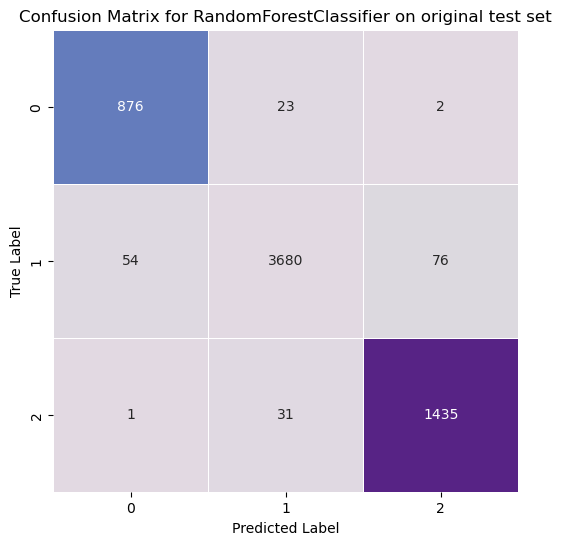

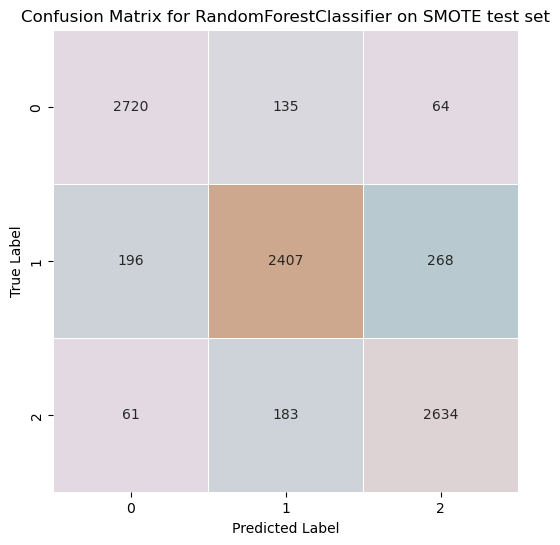

In [119]:
y_pred = rf_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy on original test set:", accuracy)
print('\nClassification report for original test set:\n', classification_report(y_test, y_pred))
matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(matrix, annot=True, cbar=False, cmap='twilight', linewidth=0.5, fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for RandomForestClassifier on original test set')

print('\nClassification report for SMOTE test set:\n', classification_report(y_test_smote, y_pred_smote))
matrix = confusion_matrix(y_test_smote, y_pred_smote)
plt.figure(figsize=(6, 6))
sns.heatmap(matrix, annot=True, cbar=False, cmap='twilight', linewidth=0.5, fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for RandomForestClassifier on SMOTE test set')

Average Precision (Macro): 94.07%
Precision-Recall AUC (Macro): 94.11%
ROC-AUC Score (Macro): 96.83%


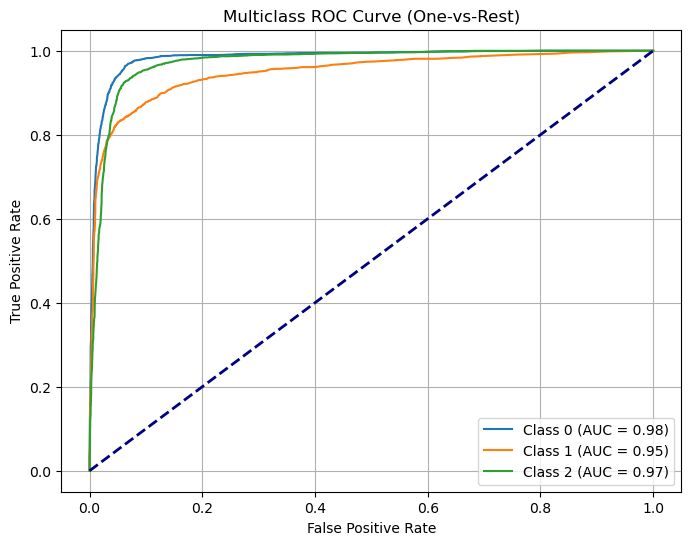

In [120]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, confusion_matrix,
    classification_report, precision_recall_curve, roc_curve, auc,
    matthews_corrcoef, cohen_kappa_score, average_precision_score, roc_auc_score
)

# Get probability predictions for all classes
y_pred_proba = rf_classifier.predict_proba(X_test_smote)

# Compute average precision score (macro-averaged across classes)
rf_avg_precision = average_precision_score(y_test_smote, y_pred_proba, average='macro')
print("Average Precision (Macro): {:.2f}%".format(rf_avg_precision * 100))

# Compute precision-recall AUC for each class
precision = dict()
recall = dict()
pr_auc = dict()
n_classes = y_pred_proba.shape[1]

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_smote == i, y_pred_proba[:, i])
    pr_auc[i] = auc(recall[i], precision[i])

# Compute macro-average PR AUC
rf_pr_auc = np.mean(list(pr_auc.values()))
print("Precision-Recall AUC (Macro): {:.2f}%".format(rf_pr_auc * 100))

# Compute ROC curve & AUC for each class (One-vs-Rest)
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_smote == i, y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC AUC
rf_auc = roc_auc_score(y_test_smote, y_pred_proba, multi_class="ovr", average="macro")
print("ROC-AUC Score (Macro): {:.2f}%".format(rf_auc * 100))

# Plot ROC Curves
plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label="Class {} (AUC = {:.2f})".format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
plt.legend(loc="lower right")
plt.title("Multiclass ROC Curve (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.grid(True)
plt.show()


    KEY 🗝️
    ______________________________________________________________________
    
    The RandomForestClassifier trained on the original test set achieves a high accuracy of approximately 97% 🥇     
    This indicates that the model performs exceptionally well in classifying the target variable 🤌  
    The RandomForestClassifier trained on the SMOTE test set achieves a slightly lower accuracy of around 90%  🥈
    Despite the lower accuracy compared to the original test set, the SMOTE model still demonstrates a respectable performance 💪
    
    ______________________________________________________________________

## XGBoost

In [123]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize and train XGBoost classifier
xgb_classifier = XGBClassifier(eval_metric='logloss')
xgb_classifier.fit(X_train_smote, y_train_smote)

print("Accuracy on SMOTE training set:", xgb_classifier.score(X_train_smote, y_train_smote))

y_pred_smote = xgb_classifier.predict(X_test_smote)
accuracy_smote = accuracy_score(y_test_smote, y_pred_smote)

print("Accuracy on SMOTE test set:", accuracy_smote)

Accuracy on SMOTE training set: 0.9050246345535242
Accuracy on SMOTE test set: 0.8638670973696354


Accuracy on training set: 0.8592424732923276
Accuracy on original test set: 0.8522175461314341


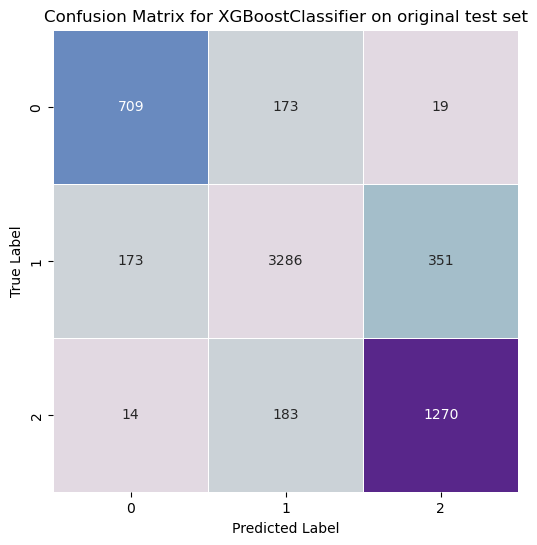


Classification report for original test set:
               precision    recall  f1-score   support

         0.0       0.79      0.79      0.79       901
         1.0       0.90      0.86      0.88      3810
         2.0       0.77      0.87      0.82      1467

    accuracy                           0.85      6178
   macro avg       0.82      0.84      0.83      6178
weighted avg       0.86      0.85      0.85      6178

Accuracy on training set: 0.9050246345535242
Accuracy on SMOTE test set: 0.8638670973696354

Classification report for SMOTE test set:
               precision    recall  f1-score   support

         0.0       0.89      0.88      0.89      2919
         1.0       0.86      0.83      0.84      2871
         2.0       0.84      0.88      0.86      2878

    accuracy                           0.86      8668
   macro avg       0.86      0.86      0.86      8668
weighted avg       0.86      0.86      0.86      8668



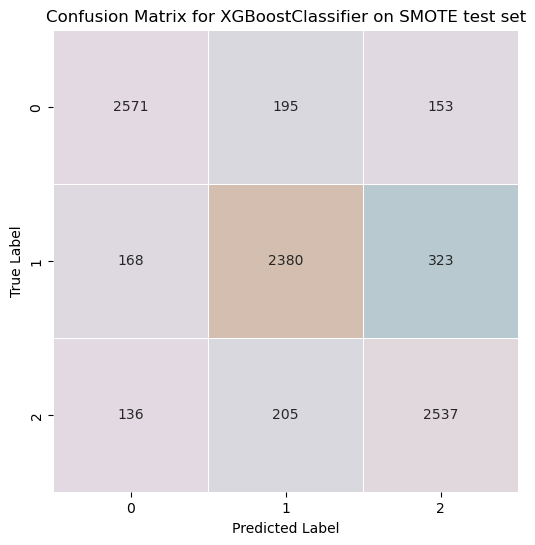

In [124]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize and train XGBoost classifier
xgb_classifier = XGBClassifier(eval_metric='logloss')
xgb_classifier.fit(X_train_smote, y_train_smote)

print("Accuracy on training set:", xgb_classifier.score(X_train, y_train))
# Make predictions
y_pred = xgb_classifier.predict(X_test)

# Accuracy score
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy on original test set:", accuracy)
i als
# Confusion matrix
matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(matrix, annot=True, cbar=False, cmap='twilight', linewidth=0.5, fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for XGBoostClassifier on original test set')
plt.show()

# Classification reports
print('\nClassification report for original test set:\n', classification_report(y_test, y_pred))


X_train_smote, X_test_smote, y_train_smote, y_test_smote = train_test_split(X_smote, y_smote, test_size=0.15, random_state=77)

xgb_classifier.fit(X_train_smote, y_train_smote)

print("Accuracy on training set:", xgb_classifier.score(X_train_smote, y_train_smote))

y_pred_smote = xgb_classifier.predict(X_test_smote)
accuracy_smote = accuracy_score(y_test_smote, y_pred_smote)

print("Accuracy on SMOTE test set:", accuracy_smote)
print('\nClassification report for SMOTE test set:\n', classification_report(y_test_smote, y_pred_smote))
# Confusion matrix
matrix = confusion_matrix(y_test_smote, y_pred_smote)
plt.figure(figsize=(6, 6))
sns.heatmap(matrix, annot=True, cbar=False, cmap='twilight', linewidth=0.5, fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for XGBoostClassifier on SMOTE test set')
plt.show()

Average Precision (Macro): 92.07%
Precision-Recall AUC (Macro): 92.07%
ROC-AUC Score (Macro): 96.83%


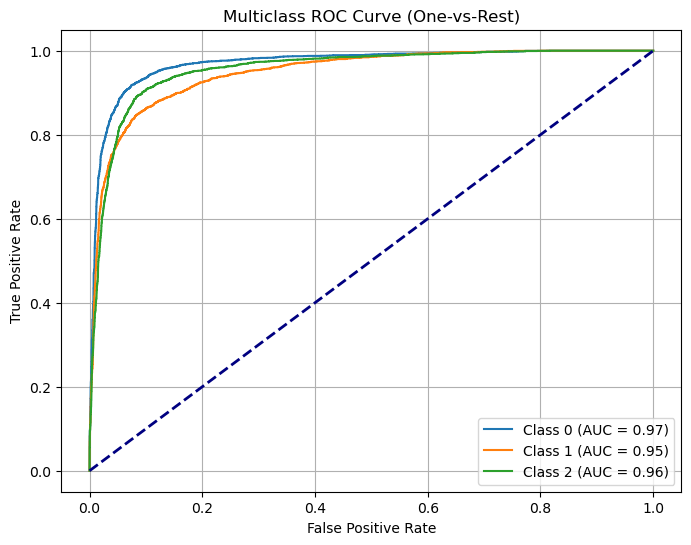

In [125]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, confusion_matrix,
    classification_report, precision_recall_curve, roc_curve, auc,
    matthews_corrcoef, cohen_kappa_score, average_precision_score, roc_auc_score
)

# Get probability predictions for all classes
y_pred_proba = xgb_classifier.predict_proba(X_test_smote)

# Compute average precision score (macro-averaged across classes)
xgb_avg_precision = average_precision_score(y_test_smote, y_pred_proba, average='macro')
print("Average Precision (Macro): {:.2f}%".format(xgb_avg_precision * 100))

# Compute precision-recall AUC for each class
precision = dict()
recall = dict()
pr_auc = dict()
n_classes = y_pred_proba.shape[1]

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_smote == i, y_pred_proba[:, i])
    pr_auc[i] = auc(recall[i], precision[i])

# Compute macro-average PR AUC
xgb_pr_auc = np.mean(list(pr_auc.values()))
print("Precision-Recall AUC (Macro): {:.2f}%".format(xgb_pr_auc * 100))

# Compute ROC curve & AUC for each class (One-vs-Rest)
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_smote == i, y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC AUC
xgb_auc = roc_auc_score(y_test_smote, y_pred_proba, multi_class="ovr", average="macro")
print("ROC-AUC Score (Macro): {:.2f}%".format(rf_auc * 100))

# Plot ROC Curves
plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label="Class {} (AUC = {:.2f})".format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
plt.legend(loc="lower right")
plt.title("Multiclass ROC Curve (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.grid(True)
plt.show()


 ## CatBoostClassifier

Accuracy on training set: 0.8142764648753642
Accuracy on original test set: 0.8138556167044351


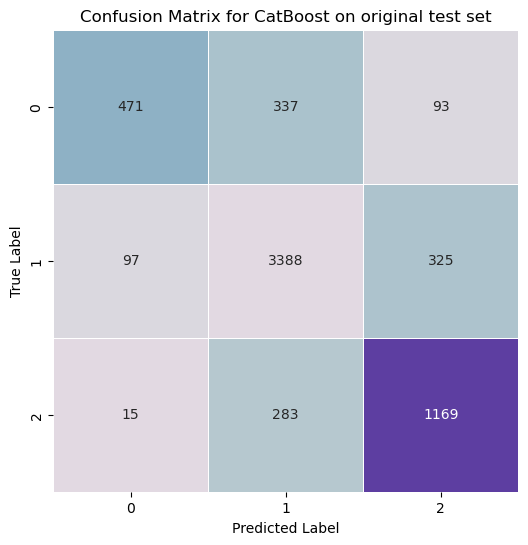


Classification report for original test set:
               precision    recall  f1-score   support

         0.0       0.81      0.52      0.63       901
         1.0       0.85      0.89      0.87      3810
         2.0       0.74      0.80      0.77      1467

    accuracy                           0.81      6178
   macro avg       0.80      0.74      0.76      6178
weighted avg       0.81      0.81      0.81      6178

Accuracy on training set: 0.8426646036076387
Accuracy on SMOTE test set: 0.8200276880479926

Classification report for SMOTE test set:
               precision    recall  f1-score   support

         0.0       0.87      0.82      0.84      2919
         1.0       0.82      0.79      0.80      2871
         2.0       0.78      0.86      0.82      2878

    accuracy                           0.82      8668
   macro avg       0.82      0.82      0.82      8668
weighted avg       0.82      0.82      0.82      8668



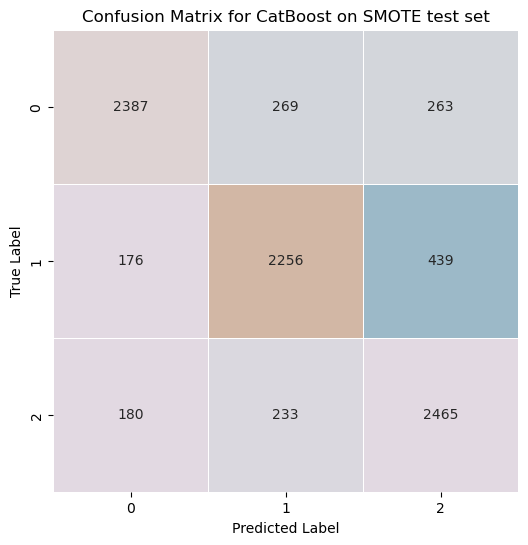

In [127]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize and train CatBoost classifier
catboost_model = CatBoostClassifier(iterations=500, learning_rate=0.1, depth=6, verbose=0, random_state=42)
catboost_model.fit(X_train, y_train)
print("Accuracy on training set:", catboost_model.score(X_train, y_train))
# Make predictions
y_pred_catboost = catboost_model.predict(X_test)

# Accuracy score
accuracy = accuracy_score(y_test, y_pred_catboost)
print("Accuracy on original test set:", accuracy)

# Confusion matrix
matrix = confusion_matrix(y_test, y_pred_catboost)
plt.figure(figsize=(6, 6))
sns.heatmap(matrix, annot=True, cbar=False, cmap='twilight', linewidth=0.5, fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for CatBoost on original test set')
plt.show()

# Classification reports
print('\nClassification report for original test set:\n', classification_report(y_test, y_pred_catboost))


X_train_smote, X_test_smote, y_train_smote, y_test_smote = train_test_split(X_smote, y_smote, test_size=0.15, random_state=77)

catboost_model.fit(X_train_smote, y_train_smote)

print("Accuracy on training set:", catboost_model.score(X_train_smote, y_train_smote))

y_pred_smote = catboost_model.predict(X_test_smote)
accuracy_smote = accuracy_score(y_test_smote, y_pred_smote)

print("Accuracy on SMOTE test set:", accuracy_smote)
print('\nClassification report for SMOTE test set:\n', classification_report(y_test_smote, y_pred_smote))
# Confusion matrix
matrix = confusion_matrix(y_test_smote, y_pred_smote)
plt.figure(figsize=(6, 6))
sns.heatmap(matrix, annot=True, cbar=False, cmap='twilight', linewidth=0.5, fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for CatBoost on SMOTE test set')
plt.show()

Average Precision (Macro): 88.69%
Precision-Recall AUC (Macro): 88.68%
ROC-AUC Score (Macro): 96.83%


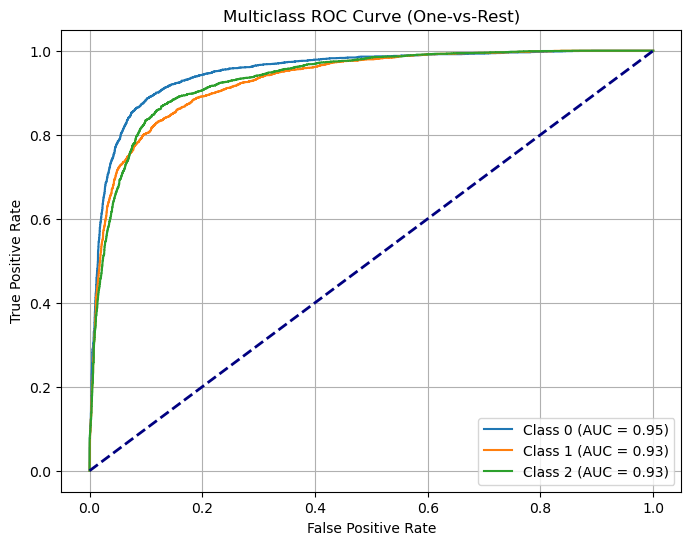

In [128]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, confusion_matrix,
    classification_report, precision_recall_curve, roc_curve, auc,
    matthews_corrcoef, cohen_kappa_score, average_precision_score, roc_auc_score
)

# Get probability predictions for all classes
y_pred_proba = catboost_model.predict_proba(X_test_smote)

# Compute average precision score (macro-averaged across classes)
catboost_avg_precision = average_precision_score(y_test_smote, y_pred_proba, average='macro')
print("Average Precision (Macro): {:.2f}%".format(catboost_avg_precision * 100))

# Compute precision-recall AUC for each class
precision = dict()
recall = dict()
pr_auc = dict()
n_classes = y_pred_proba.shape[1]

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_smote == i, y_pred_proba[:, i])
    pr_auc[i] = auc(recall[i], precision[i])

# Compute macro-average PR AUC
catboost_pr_auc = np.mean(list(pr_auc.values()))
print("Precision-Recall AUC (Macro): {:.2f}%".format(catboost_pr_auc * 100))

# Compute ROC curve & AUC for each class (One-vs-Rest)
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_smote == i, y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute macro-average ROC AUC
catboost_auc = roc_auc_score(y_test_smote, y_pred_proba, multi_class="ovr", average="macro")
print("ROC-AUC Score (Macro): {:.2f}%".format(rf_auc * 100))

# Plot ROC Curves
plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label="Class {} (AUC = {:.2f})".format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
plt.legend(loc="lower right")
plt.title("Multiclass ROC Curve (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.grid(True)
plt.show()


In [ ]:
import joblib
joblib.dump(rf_classifier, 'rfModel.joblib')

In [131]:
joblib.dump(xgb_classifier, 'xgbModel.joblib')

['xgbModel.joblib']

In [134]:
joblib.dump(catboost_model, 'cbModel.joblib')

['cbModel.joblib']

In [43]:
import joblib
rf_classifier = joblib.load('rfModel.joblib')

In [44]:
xgb_classifier = joblib.load('xgbModel.joblib')

In [45]:
catboost_model = joblib.load('cbModel.joblib')

<a id="conclusion"></a>
## 7. XAI

In [111]:
# import matplotlib.pyplot as plt
# from sklearn.tree import plot_tree
# # Plot the tree using the plot_tree function from sklearn
# tree = rf_classifier.estimators_[0]
# plt.figure(figsize=(20,10))  # Set figure size to make the tree more readable
# plot_tree(tree, 
#           feature_names= X_train_smote.columns,  # Use the feature names from the dataset
#           class_names=['Bad', 'Standard', 'Good'],  # Use class names (species names)
#           filled=True,              # Fill nodes with colors for better visualization
#           rounded=True)             # Rounded edges for nodes
# plt.title("Decision Tree from the Random Forest")
# plt.show()

## Permutation Feature Importance

In [46]:
pip install shap

Note: you may need to restart the kernel to use updated packages.


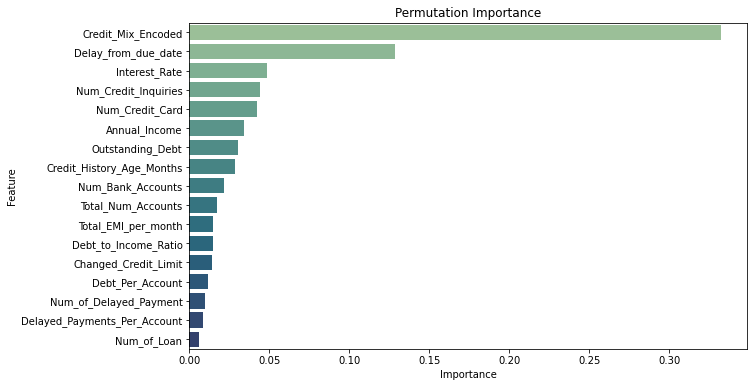

In [47]:
from sklearn.inspection import permutation_importance
perm_importance = permutation_importance(rf_classifier, X_test_smote, y_test_smote, n_repeats=10, random_state=42)

perm_importance_df = pd.DataFrame({'Feature': X_train_smote.columns, 'Importance': perm_importance.importances_mean})

perm_importance_df_sorted = perm_importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=perm_importance_df_sorted, x='Importance', y='Feature', palette='crest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Permutation Importance')
plt.show()

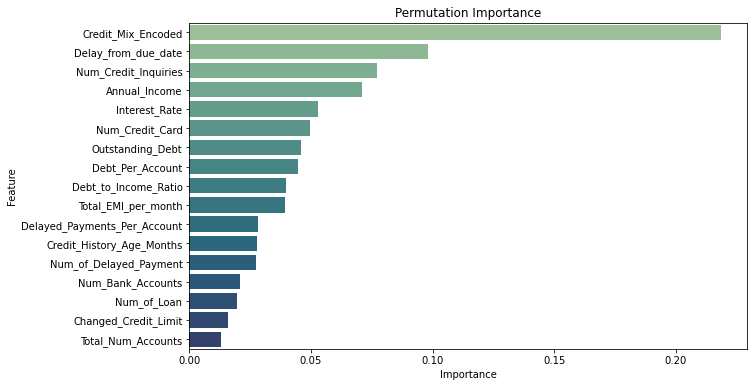

In [48]:
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(xgb_classifier, X_test_smote, y_test_smote, n_repeats=10, random_state=42)

perm_importance_df = pd.DataFrame({'Feature': X_train_smote.columns, 'Importance': perm_importance.importances_mean})

perm_importance_df_sorted = perm_importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=perm_importance_df_sorted, x='Importance', y='Feature', palette='crest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Permutation Importance')
plt.show()


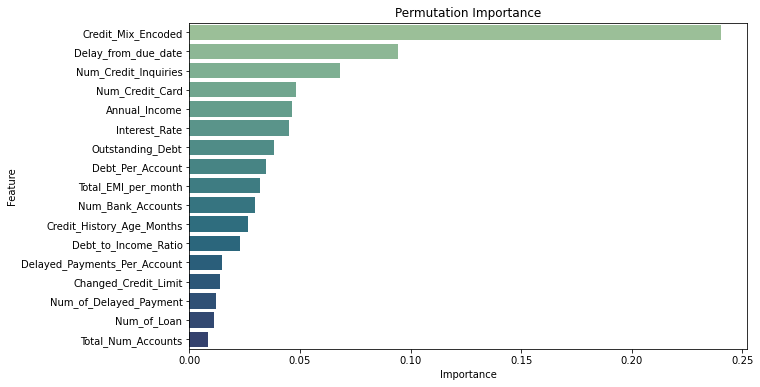

In [49]:
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(catboost_model, X_test_smote, y_test_smote, n_repeats=10, random_state=42)

perm_importance_df = pd.DataFrame({'Feature': X_train_smote.columns, 'Importance': perm_importance.importances_mean})

perm_importance_df_sorted = perm_importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=perm_importance_df_sorted, x='Importance', y='Feature', palette='crest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Permutation Importance')
plt.show()


In [50]:
import xgboost
print(xgboost.__version__)

2.1.3


## 7.2 SHAP

### Random Forest

In [51]:
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer
rf_explainer = shap.TreeExplainer(rf_classifier)

rf_shap_values = rf_explainer.shap_values(X_test_smote)

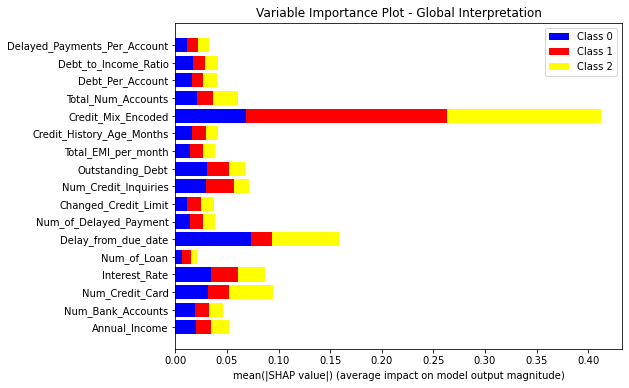

In [52]:
import numpy as np
import matplotlib.pyplot as plt

# Compute mean absolute SHAP values per class
rf_shap_values_mean = np.abs(rf_shap_values).mean(axis=0)  # Shape: (17, 3)
features = X_test_smote.columns  # Feature names

# Initialize plot
fig, ax = plt.subplots(figsize=(8, 6))
bottom = np.zeros(len(features))  # Initialize bottom for stacking

colors = ["blue", "red", "yellow"]  # Colors for Class 0, 1, 2
class_labels = [f"Class {i}" for i in range(rf_shap_values_mean.shape[1])]  # Class labels

# Loop through each class and plot stacked bars
for i in range(rf_shap_values_mean.shape[1]):  # Loop over classes (3 classes)
    ax.barh(features, rf_shap_values_mean[:, i], left=bottom, color=colors[i], label=class_labels[i])
    bottom += rf_shap_values_mean[:, i]  # Stack bars

# Formatting
ax.set_xlabel("mean(|SHAP value|) (average impact on model output magnitude)")
ax.set_title("Variable Importance Plot - Global Interpretation")
ax.legend()
plt.show()


Shap Values : Poor Credit Score - Global Interpretation


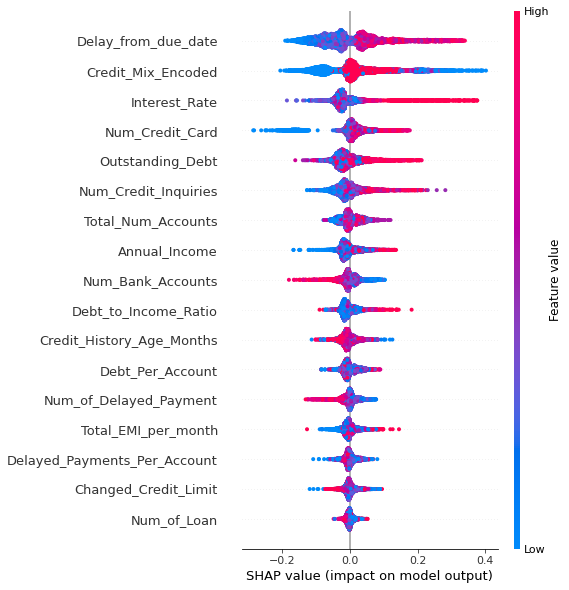

In [53]:
print("Shap Values : Poor Credit Score - Global Interpretation")
figure = plt.figure()
shap.summary_plot(rf_shap_values[:, :, 0], X_test_smote, show=False)

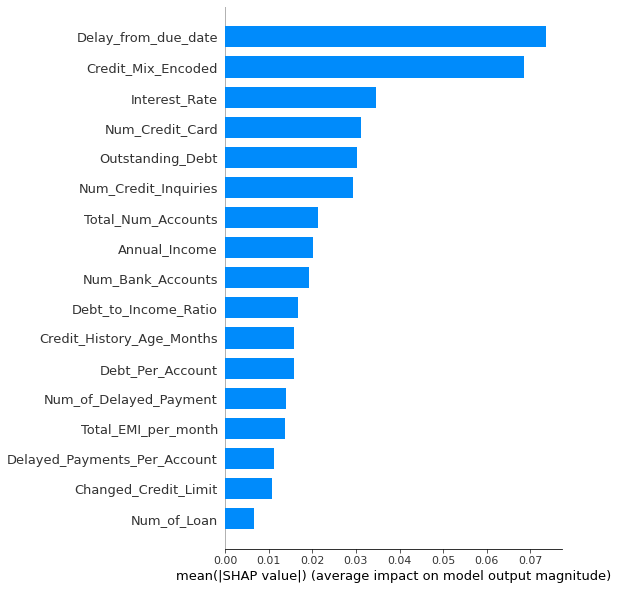

In [54]:
shap.summary_plot(rf_shap_values[:,:,0], X_test_smote, plot_type="bar")

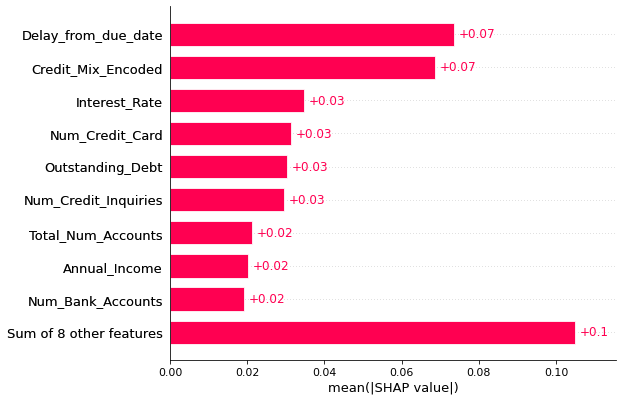

In [55]:
shap_exp = shap.Explanation(values=rf_shap_values[:, :, 0], feature_names=X_test_smote.columns)
shap.plots.bar(shap_exp)

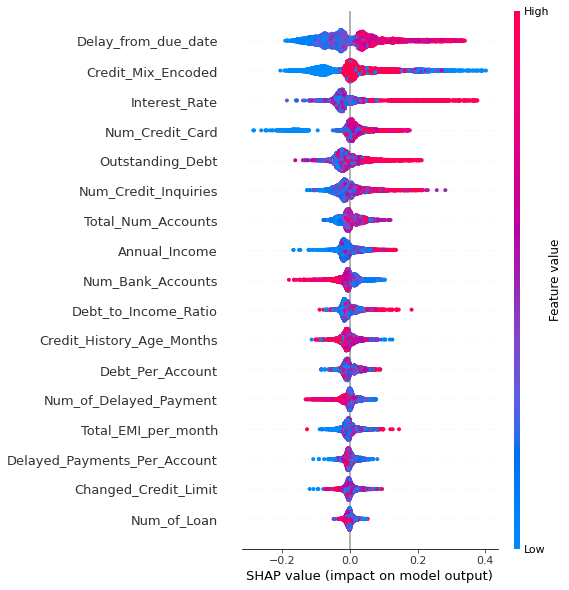

In [96]:
# Generate summary plot for Class 0
shap.summary_plot(rf_shap_values[:, :, 0], X_test_smote)

In [93]:
rf_shap_values_loaded.shape

(8668, 17, 3)

Shap Values : Standard Credit Score - Global Interpretation


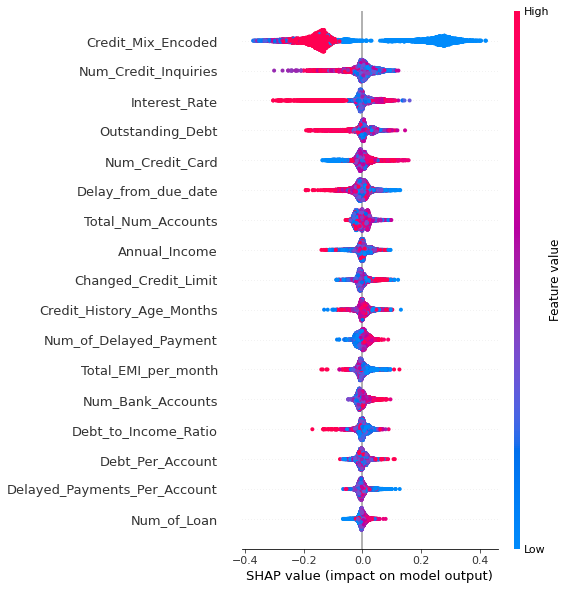

In [60]:
print("Shap Values : Standard Credit Score - Global Interpretation")
figure = plt.figure()
shap.summary_plot(rf_shap_values[:, :, 1], X_test_smote, show=False)

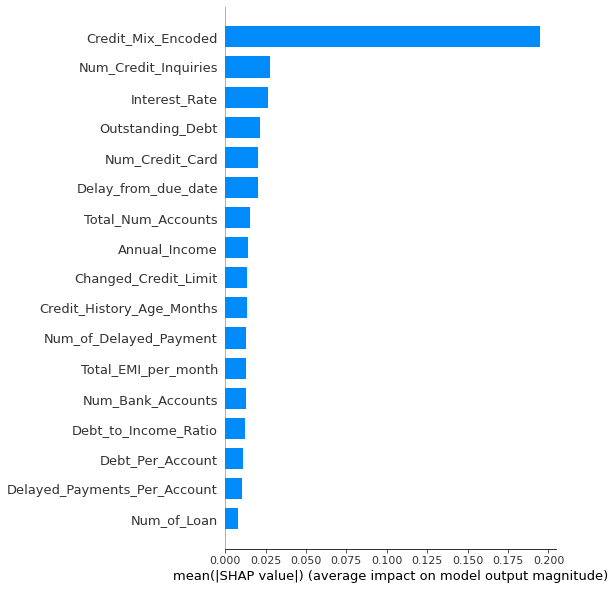

In [61]:
shap.summary_plot(rf_shap_values[:,:,1], X_test_smote, plot_type="bar")

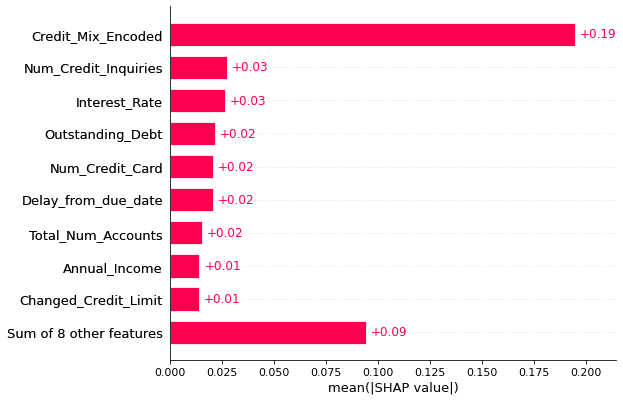

In [62]:
shap_exp = shap.Explanation(values=rf_shap_values[:, :, 1], feature_names=X_test_smote.columns)
shap.plots.bar(shap_exp)

Shap Values : Good Credit Score - Global Interpretation


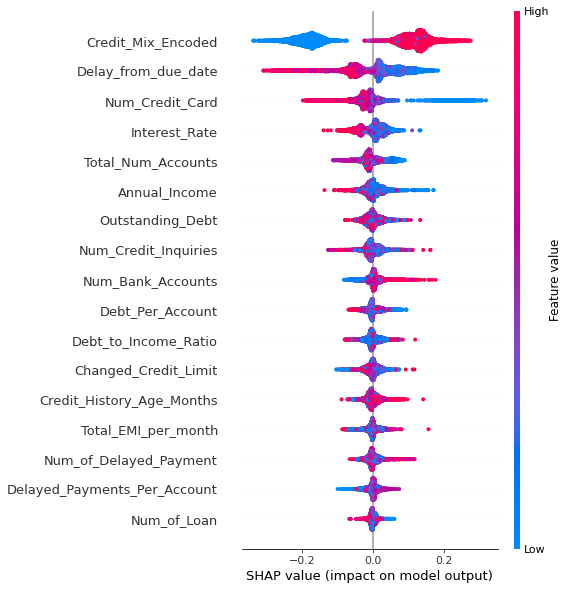

In [63]:
print("Shap Values : Good Credit Score - Global Interpretation")
figure = plt.figure()
shap.summary_plot(rf_shap_values[:, :, 2], X_test_smote, show=False)

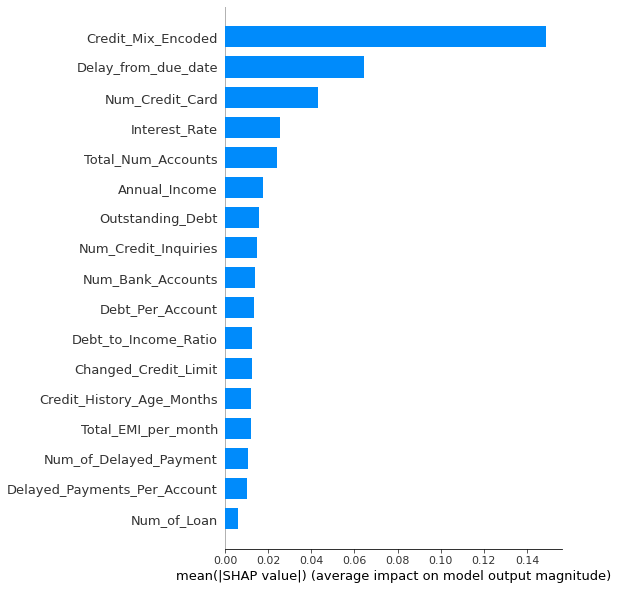

In [64]:
shap.summary_plot(rf_shap_values[:,:,2], X_test_smote, plot_type="bar")

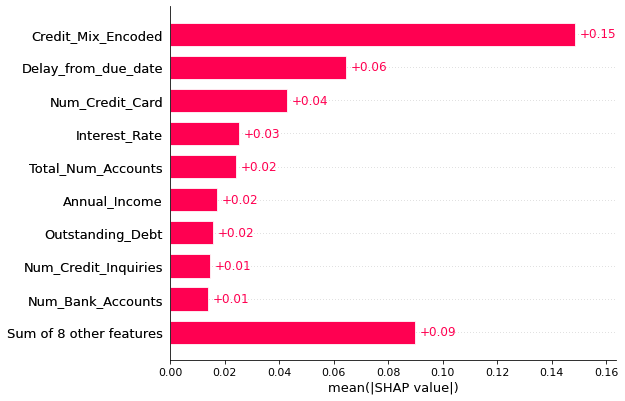

In [65]:
shap_exp = shap.Explanation(values=rf_shap_values[:, :, 2], feature_names=X_test_smote.columns)
shap.plots.bar(shap_exp)

In [66]:
import pandas as pd

# Assuming shap_values has shape (8668, 17, 3) and X_test_smote contains feature names

# Create a list to store SHAP DataFrames per class
shap_dfs = []

for class_idx in range(rf_shap_values.shape[2]):  # Loop over each class
    temp_df = pd.DataFrame(rf_shap_values[:, :, class_idx], columns=X_test_smote.columns)
    temp_df["Class"] = f"Class_{class_idx}"  # Add class column
    shap_dfs.append(temp_df)

# Concatenate all SHAP values into one DataFrame (stacked format)
shap_df_final = pd.concat(shap_dfs, axis=0)

# Save to Excel
excel_filename = "rf_shap_values_with_classes.xlsx"
shap_df_final.to_excel(excel_filename, index=False)

print(f"SHAP values saved successfully as {excel_filename}!")


SHAP values saved successfully as rf_shap_values_with_classes.xlsx!


In [67]:
import pandas as pd
import numpy as np

# Load the Excel file
excel_filename = "rf_shap_values_with_classes.xlsx"
shap_df_loaded = pd.read_excel(excel_filename)

# Save column names before dropping the "Class" column
feature_names = shap_df_loaded.columns[:-1]  # Exclude "Class" column

# Extract unique class labels to determine the number of classes
class_labels = shap_df_loaded["Class"].unique()
num_classes = len(class_labels)

# Remove the "Class" column to get only the SHAP values
shap_values_array = shap_df_loaded.drop(columns=["Class"]).values

# Reshape back to (8668, 17, 3)
rf_shap_values_loaded = shap_values_array.reshape(8668, 17, num_classes)

# Verify the shape
print("Loaded SHAP values shape:", rf_shap_values_loaded.shape)

# Print the feature names
print("Feature Names:", list(feature_names))


Loaded SHAP values shape: (8668, 17, 3)
Feature Names: ['Annual_Income', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt', 'Total_EMI_per_month', 'Credit_History_Age_Months', 'Credit_Mix_Encoded', 'Total_Num_Accounts', 'Debt_Per_Account', 'Debt_to_Income_Ratio', 'Delayed_Payments_Per_Account']


### CatBoost Classifier

In [68]:
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer
cb_explainer = shap.TreeExplainer(catboost_model)

cb_shap_values = cb_explainer.shap_values(X_test_smote)

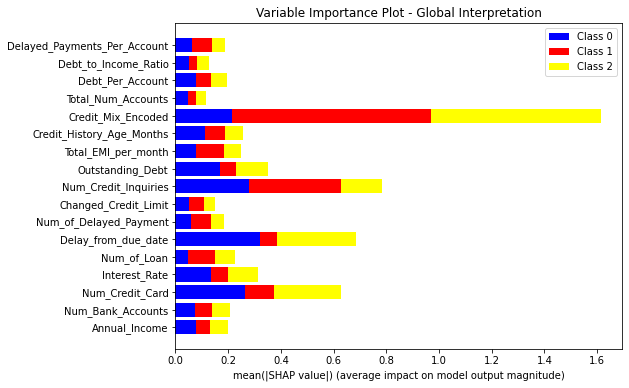

In [69]:
import numpy as np
import matplotlib.pyplot as plt

# Compute mean absolute SHAP values per class
cb_shap_values_mean = np.abs(cb_shap_values).mean(axis=0)  # Shape: (17, 3)
features = X_test_smote.columns  # Feature names

# Initialize plot
fig, ax = plt.subplots(figsize=(8, 6))
bottom = np.zeros(len(features))  # Initialize bottom for stacking

colors = ["blue", "red", "yellow"]  # Colors for Class 0, 1, 2
class_labels = [f"Class {i}" for i in range(cb_shap_values_mean.shape[1])]  # Class labels

# Loop through each class and plot stacked bars
for i in range(cb_shap_values_mean.shape[1]):  # Loop over classes (3 classes)
    ax.barh(features, cb_shap_values_mean[:, i], left=bottom, color=colors[i], label=class_labels[i])
    bottom += cb_shap_values_mean[:, i]  # Stack bars

# Formatting
ax.set_xlabel("mean(|SHAP value|) (average impact on model output magnitude)")
ax.set_title("Variable Importance Plot - Global Interpretation")
ax.legend()
plt.show()


Shap Values : Poor Credit Score - Global Interpretation


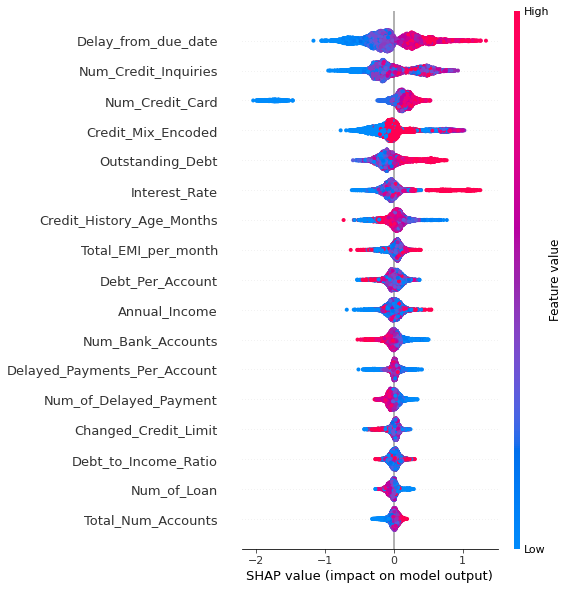

In [70]:
print("Shap Values : Poor Credit Score - Global Interpretation")
figure = plt.figure()
shap.summary_plot(cb_shap_values[:, :, 0], X_test_smote, show=False)

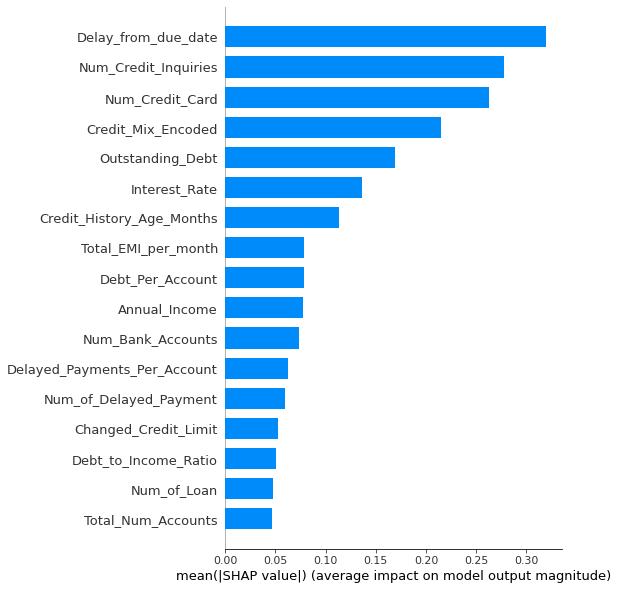

In [71]:
shap.summary_plot(cb_shap_values[:,:,0], X_test_smote, plot_type="bar")

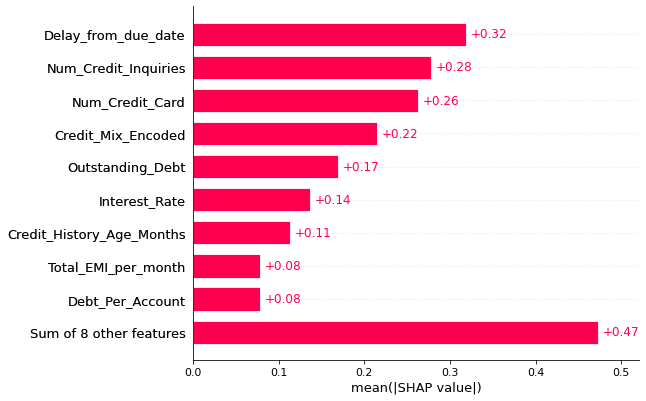

In [72]:
shap_exp = shap.Explanation(values=cb_shap_values[:, :, 0], feature_names=X_test_smote.columns)
shap.plots.bar(shap_exp)

Shap Values : Standard Credit Score - Global Interpretation


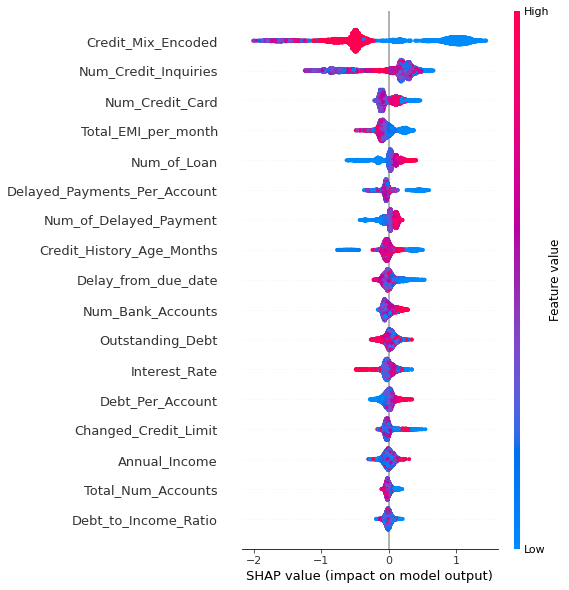

In [73]:
print("Shap Values : Standard Credit Score - Global Interpretation")
figure = plt.figure()
shap.summary_plot(cb_shap_values[:, :, 1], X_test_smote, show=False)

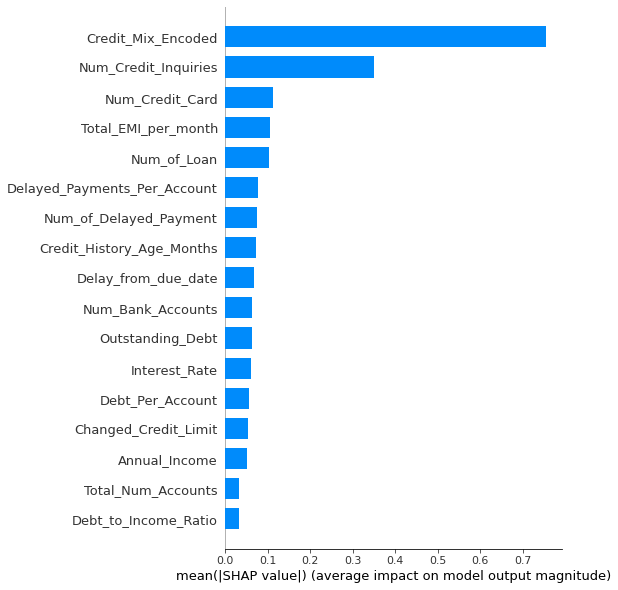

In [74]:
shap.summary_plot(cb_shap_values[:,:,1], X_test_smote, plot_type="bar")

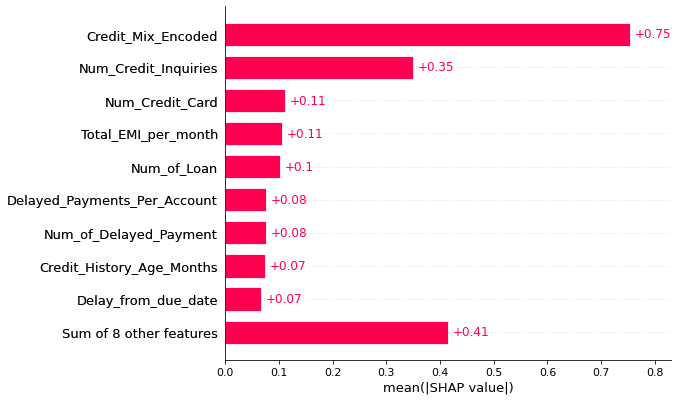

In [75]:
shap_exp = shap.Explanation(values=cb_shap_values[:, :, 1], feature_names=X_test_smote.columns)
shap.plots.bar(shap_exp)

Shap Values : Good Credit Score - Global Interpretation


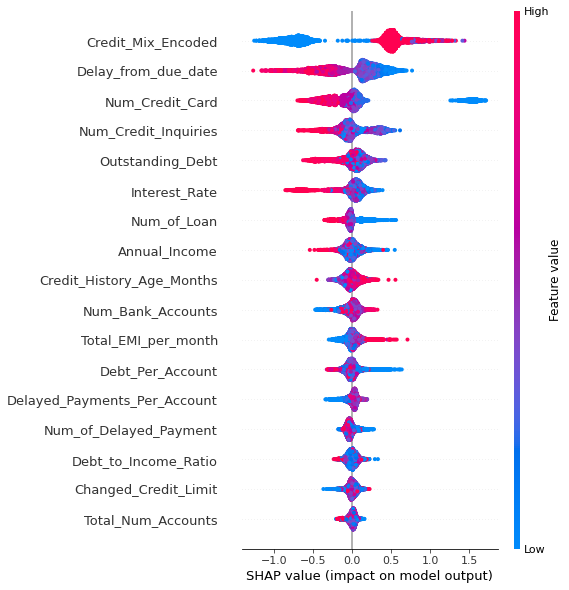

In [76]:
print("Shap Values : Good Credit Score - Global Interpretation")
figure = plt.figure()
shap.summary_plot(cb_shap_values[:, :, 2], X_test_smote, show=False)

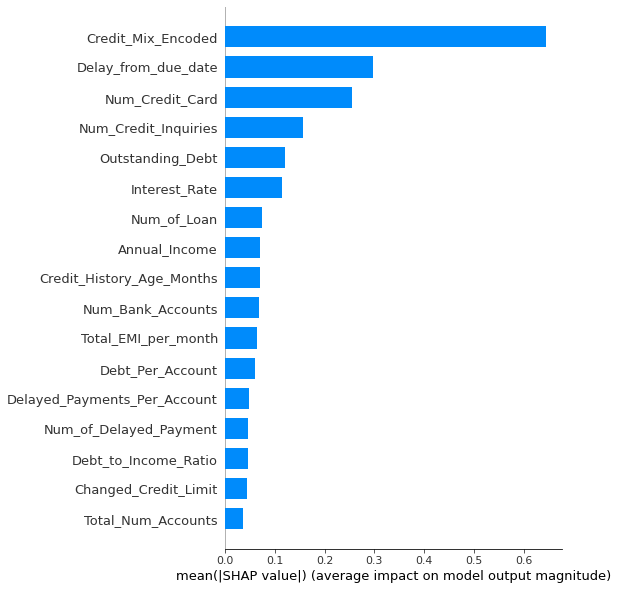

In [77]:
shap.summary_plot(cb_shap_values[:,:,2], X_test_smote, plot_type="bar")

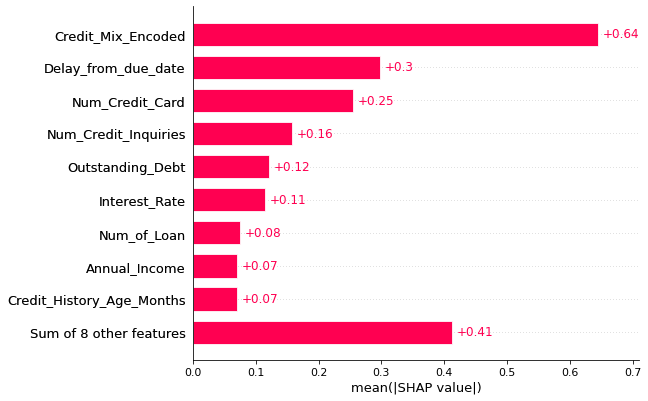

In [78]:
shap_exp = shap.Explanation(values=cb_shap_values[:, :, 2], feature_names=X_test_smote.columns)
shap.plots.bar(shap_exp)

### XG Boost Classifier

In [79]:
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer
xgb_explainer = shap.TreeExplainer(xgb_classifier)

shap_values = xgb_explainer.shap_values(X_test_smote)

In [80]:
shap_values.shape

(8668, 17, 3)

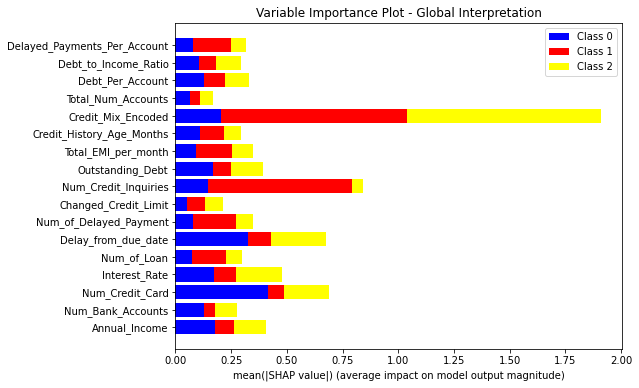

In [81]:
import numpy as np
import matplotlib.pyplot as plt

# Compute mean absolute SHAP values per class
shap_values_mean = np.abs(shap_values).mean(axis=0)  # Shape: (17, 3)
features = X_test_smote.columns  # Feature names

# Initialize plot
fig, ax = plt.subplots(figsize=(8, 6))
bottom = np.zeros(len(features))  # Initialize bottom for stacking

colors = ["blue", "red", "yellow"]  # Colors for Class 0, 1, 2
class_labels = [f"Class {i}" for i in range(shap_values_mean.shape[1])]  # Class labels

# Loop through each class and plot stacked bars
for i in range(shap_values_mean.shape[1]):  # Loop over classes (3 classes)
    ax.barh(features, shap_values_mean[:, i], left=bottom, color=colors[i], label=class_labels[i])
    bottom += shap_values_mean[:, i]  # Stack bars

# Formatting
ax.set_xlabel("mean(|SHAP value|) (average impact on model output magnitude)")
ax.set_title("Variable Importance Plot - Global Interpretation")
ax.legend()
plt.show()


Shap Values : Bad Credit Score - Global Interpretation


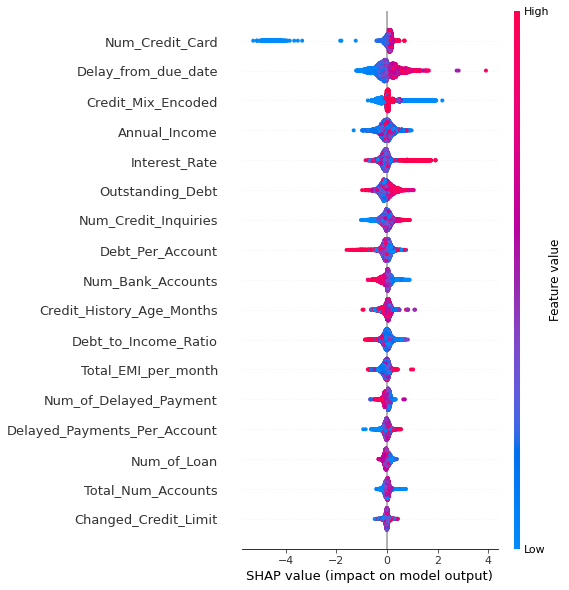

In [82]:
print("Shap Values : Bad Credit Score - Global Interpretation")
figure = plt.figure()
shap.summary_plot(shap_values[:, :, 0], X_test_smote, show=False)

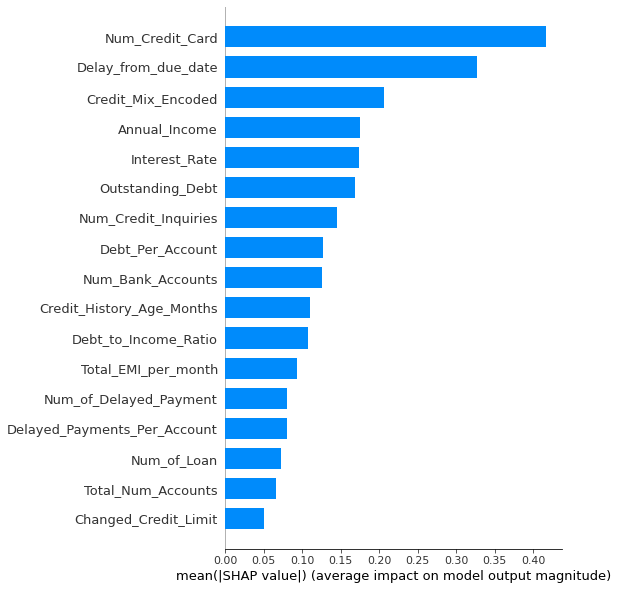

In [83]:
shap.summary_plot(shap_values[:,:,0], X_test_smote, plot_type="bar")

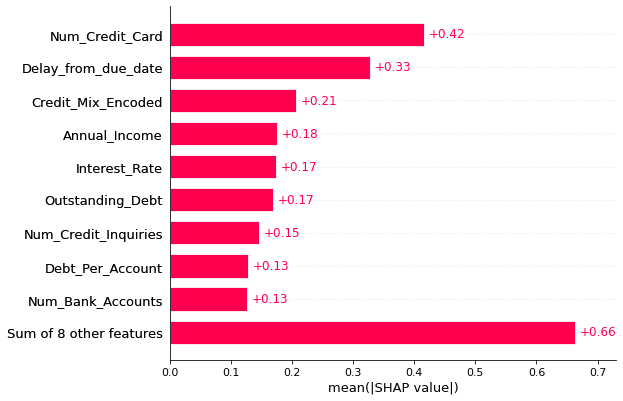

In [84]:
shap_exp = shap.Explanation(values=shap_values[:, :, 0], feature_names=X_test_smote.columns)
shap.plots.bar(shap_exp)

Shap Values : Standard Credit Score - Global Interpretation


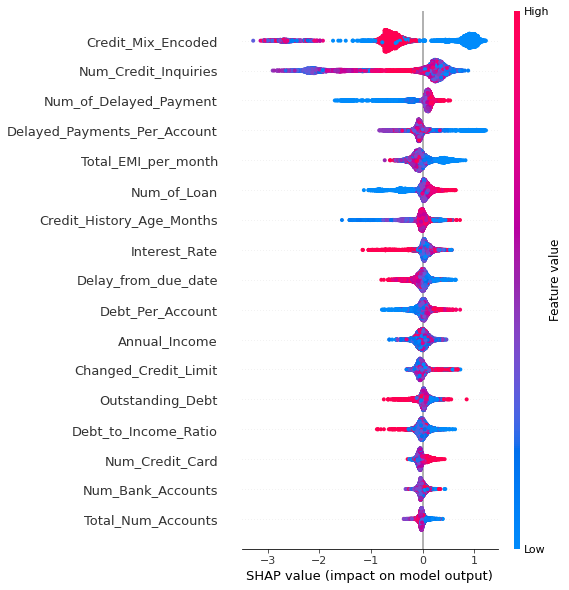

In [85]:
print("Shap Values : Standard Credit Score - Global Interpretation")
figure = plt.figure()
shap.summary_plot(shap_values[:, :, 1], X_test_smote, show=False)

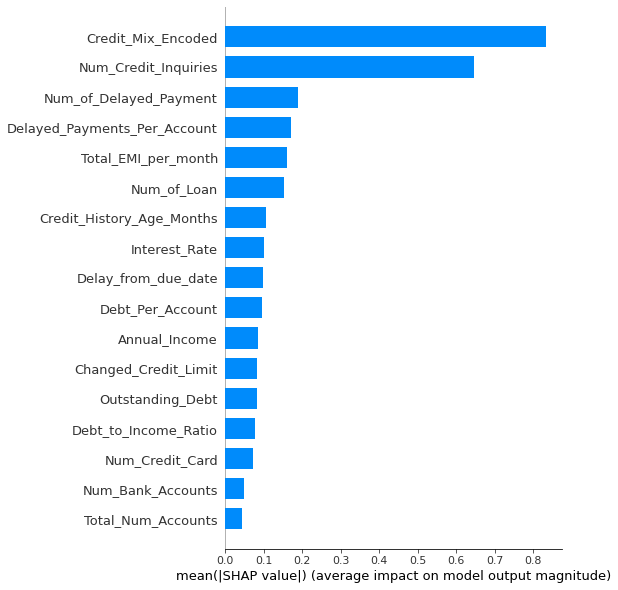

In [86]:
shap.summary_plot(shap_values[:,:,1], X_test_smote, plot_type="bar")

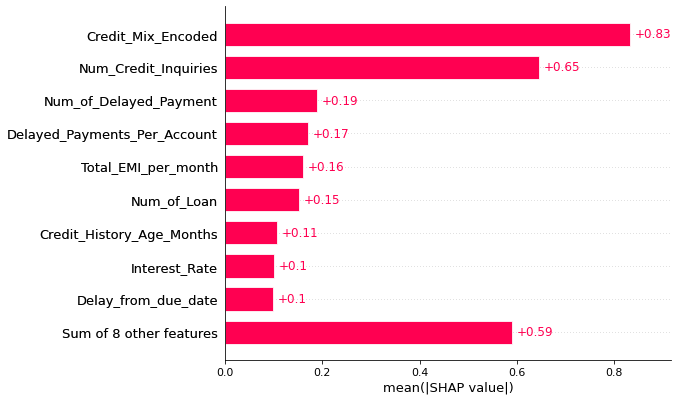

In [87]:
shap_exp = shap.Explanation(values=shap_values[:, :, 1], feature_names=X_test_smote.columns)
shap.plots.bar(shap_exp)

Shap Values : Good Credit Score - Global Interpretation


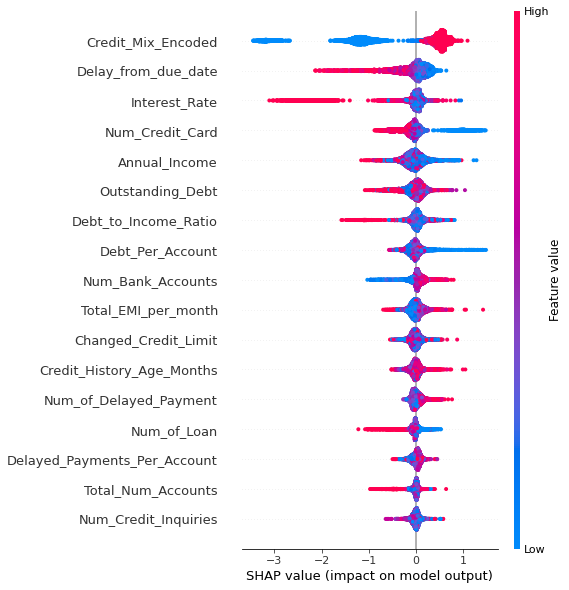

In [88]:
print("Shap Values : Good Credit Score - Global Interpretation")
figure = plt.figure()
shap.summary_plot(shap_values[:, :, 2], X_test_smote, show=False)

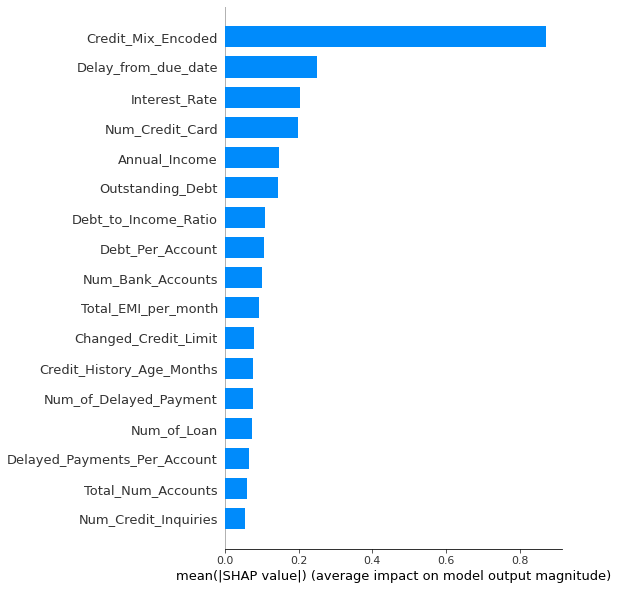

In [89]:
shap.summary_plot(shap_values[:,:,2], X_test_smote, plot_type="bar")

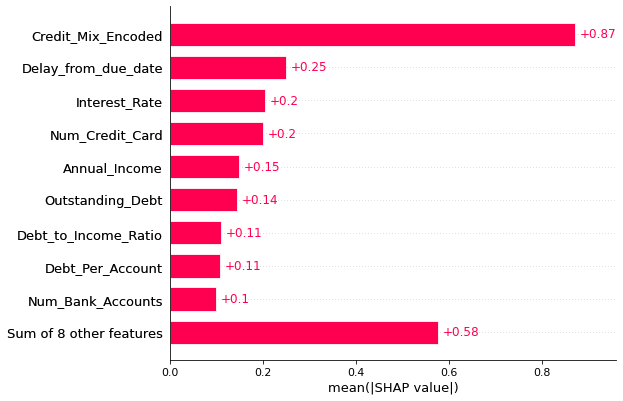

In [90]:
shap_exp = shap.Explanation(values=shap_values[:, :, 2], feature_names=X_test_smote.columns)
shap.plots.bar(shap_exp)

In [91]:
shap_values.shape

(8668, 17, 3)

In [92]:
X_test_smote.shape

(8668, 17)

In [178]:
# explainer = shap.explainers.Permutation(catboost_model.predict_proba, X_smote)
# shap_values = explainer(X_smote)

# # get just the explanations for the positive class
# shap_values = shap_values[..., 1]

In [179]:
# shap.plots.bar(shap_values)

## 7.2 Lime

In [293]:
#pip install lime

In [ ]:
import lime
import lime.lime_tabular
# Ensure class names are defined correctly
class_names = ['Poor', 'Standard', 'Good']

# Create a LIME explainer with class names
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_smote.values, 
    feature_names=X_train_smote.columns, 
    class_names=class_names,  # Fix class label mismatch
    mode='classification'
)

In [183]:
X_test_smote

,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Total_EMI_per_month,Credit_History_Age_Months,Credit_Mix_Encoded,Total_Num_Accounts,Debt_Per_Account,Debt_to_Income_Ratio,Delayed_Payments_Per_Account
15711,12679.725000,7,3,6,4,16,0,9.840000,1.000000,1226.770000,33.353511,338,2.0,10,122.677000,0.096751,0.000000
39279,21469.245000,0,4,10,2,6,1,0.630000,5.637525,909.930000,33.394823,347,2.0,4,227.482500,0.042383,0.395629
21624,78626.490000,5,4,9,4,13,16,6.730000,0.000000,550.100000,140.732220,209,1.0,9,61.122222,0.006996,1.777778
23777,9760.495000,7,6,29,6,16,24,6.020000,6.000000,1291.360000,47.852426,85,0.0,13,99.335385,0.132305,1.846154
6924,108680.190000,8,7,5,1,13,9,12.260000,5.000000,1439.290000,60.640898,206,1.0,15,95.952667,0.013243,0.600000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24383,16862.880000,8,8,22,7,52,19,19.070000,7.000000,1377.710000,81.804037,205,1.0,16,86.106875,0.081701,1.187500
3542,16523.745000,1,4,1,4,10,8,10.060000,4.000000,455.490000,52.216169,306,2.0,5,91.098000,0.027566,1.600000
41256,15648.785000,1,6,2,4,1,9,5.473209,2.000000,133.990000,40.582582,228,2.0,7,19.141429,0.008562,1.373201
31409,47958.760000,6,4,7,3,30,9,7.487084,3.000000,180.730000,93.077430,65,2.0,10,18.073000,0.003768,0.900000


In [189]:
instance=X_test_smote.iloc[788]
explaination=explainer.explain_instance(instance,rf_classifier.predict_proba,top_labels=1)
explaination.show_in_notebook()
# Save explanation as an HTML file
explaination.save_to_file("rfBadlime_explanation.html")

C:\Users\mrick\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



In [194]:
instance=X_test_smote.iloc[788]
explaination=explainer.explain_instance(instance,xgb_classifier.predict_proba,top_labels=1)
explaination.show_in_notebook()
explaination.save_to_file("xgbBadlime_explanation.html")

In [196]:
instance=X_test_smote.iloc[788]
explaination=explainer.explain_instance(instance,catboost_model.predict_proba,top_labels=1)
explaination.show_in_notebook()
explaination.save_to_file("cbBadlime_explanation.html")

In [199]:
instance=X_test_smote.iloc[999]
explaination=explainer.explain_instance(instance,rf_classifier.predict_proba,top_labels=1)
explaination.show_in_notebook()
explaination.save_to_file("rfStandardLime_explanation.html")

C:\Users\mrick\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



In [200]:
instance=X_test_smote.iloc[1888]
explaination=explainer.explain_instance(instance,xgb_classifier.predict_proba,top_labels=1)
explaination.show_in_notebook()
explaination.save_to_file("xgbStandardime_explanation.html")

In [201]:
instance=X_test_smote.iloc[999]
explaination=explainer.explain_instance(instance,catboost_model.predict_proba,top_labels=1)
explaination.show_in_notebook()
explaination.save_to_file("cbStandardime_explanation.html")

In [ ]:
instance=X_test_smote.iloc[932]
explaination=explainer.explain_instance(instance,rf_classifier.predict_proba,top_labels=1)
explaination.show_in_notebook()
explaination.save_to_file("rfGoodLime_explanation.html")

In [ ]:
instance=X_test_smote.iloc[932]
explaination=explainer.explain_instance(instance,xgb_classifier.predict_proba,top_labels=1)
explaination.show_in_notebook()
explaination.save_to_file("xgbGoodLime_explanation.html")

In [ ]:
instance=X_test_smote.iloc[932]
explaination=explainer.explain_instance(instance,catboost_model.predict_proba,top_labels=1)
explaination.show_in_notebook()
explaination.save_to_file("cbGoodLime_explanation.html")

In [ ]:
treeexplainer for rf, catboost

## 7.3 PDP

XAI (Global): Partial Dependence Plot (PDP)¶
Now, we attempt to identify the marginal effect of individual features on the predicted outcome.

PDP shows how changes in one feature affect a model's prediction while keeping other features constant. For example, a flat line implies little or no impact, while an upward slope indicates a positive influence.

Specifically, we focus on the 3 features:

Credit Mix
Delayed from due date
Number of credit inquiries

### 7.3.1 Random Forest - PDP for Credit Mix,Delayed from due date,Number of credit inquiries


Key Observations from PDP:

Poor s"

Stadard -

Good g)

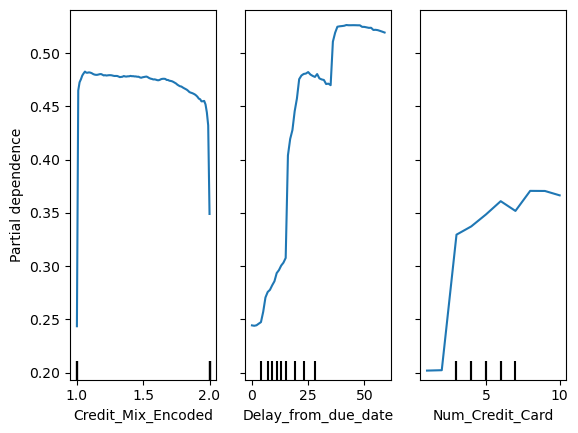

In [223]:
from sklearn.inspection import PartialDependenceDisplay

# Use PartialDependenceDisplay instead of plot_partial_dependence
features = ['Credit_Mix_Encoded', 'Delay_from_due_date', 'Num_Credit_Card']
PartialDependenceDisplay.from_estimator(rf_classifier, X_test_smote, features=features,target=0)


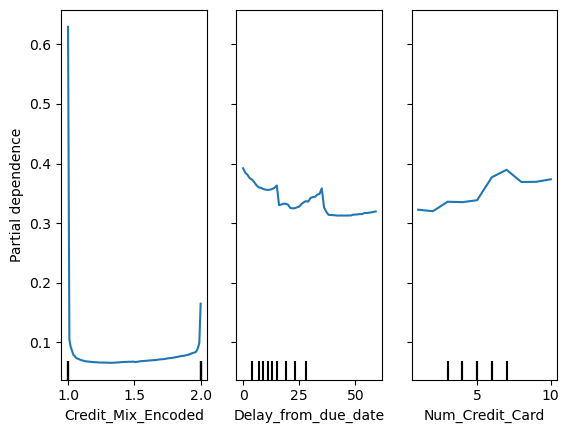

In [128]:
from sklearn.inspection import PartialDependenceDisplay

# Use PartialDependenceDisplay instead of plot_partial_dependence
features = ['Credit_Mix_Encoded', 'Delay_from_due_date', 'Num_Credit_Card']
PartialDependenceDisplay.from_estimator(rf_classifier, X_test_smote, features=features,target=1)


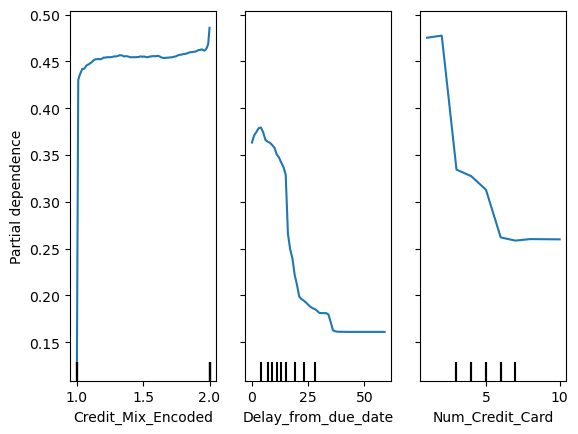

In [129]:
from sklearn.inspection import PartialDependenceDisplay

# Use PartialDependenceDisplay instead of plot_partial_dependence
features = ['Credit_Mix_Encoded', 'Delay_from_due_date', 'Num_Credit_Card']
PartialDependenceDisplay.from_estimator(rf_classifier, X_test_smote, features=features,target=2)


### 7.3.2 XGB Classifier - PDP for Credit Mix,Delayed from due date,Number of credit inquiries


Key Observations from PDP:

Poor - 

Stadard -

Good - 

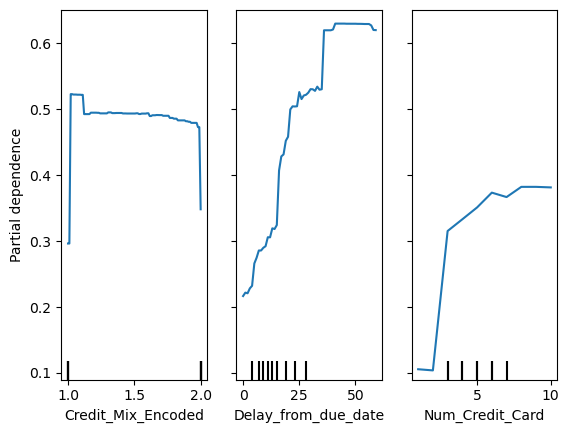

In [224]:
from sklearn.inspection import PartialDependenceDisplay

features = ['Credit_Mix_Encoded', 'Delay_from_due_date', 'Num_Credit_Card']
PartialDependenceDisplay.from_estimator(xgb_classifier, X_test_smote, features=features,target=0)


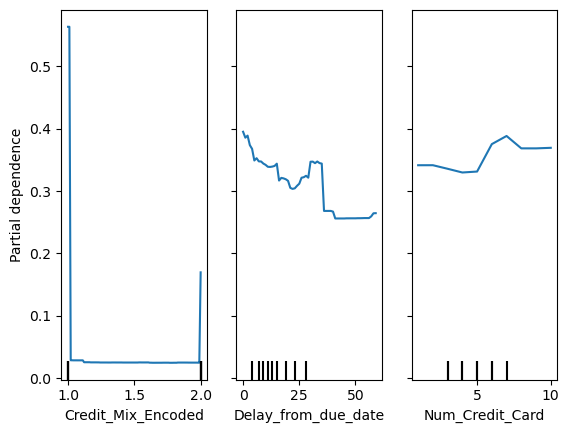

In [130]:
from sklearn.inspection import PartialDependenceDisplay

features = ['Credit_Mix_Encoded', 'Delay_from_due_date', 'Num_Credit_Card']
PartialDependenceDisplay.from_estimator(xgb_classifier, X_test_smote, features=features,target=1)


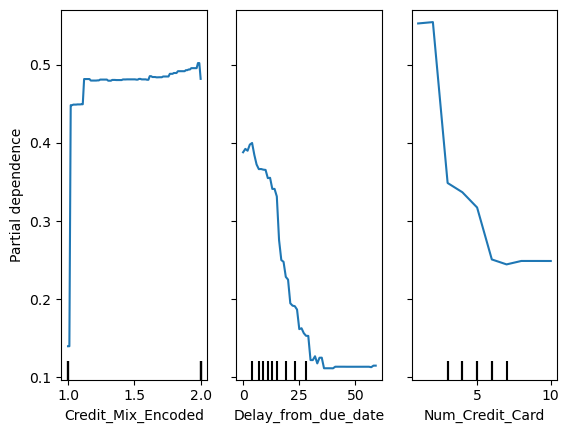

In [131]:
from sklearn.inspection import PartialDependenceDisplay

features = ['Credit_Mix_Encoded', 'Delay_from_due_date', 'Num_Credit_Card']
PartialDependenceDisplay.from_estimator(xgb_classifier, X_test_smote, features=features,target=2)


### 7.3.3 CatBoost - PDP for Credit Mix,Delayed from due date,Number of credit inquiries


Key Observations from PDP:

Poor - 

Stadard -

Good - 

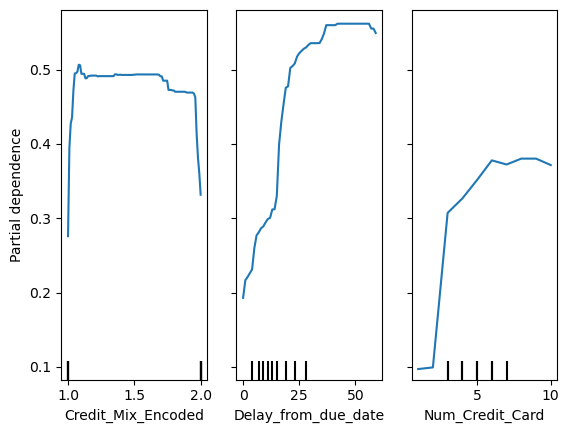

In [225]:
from sklearn.inspection import PartialDependenceDisplay

features = ['Credit_Mix_Encoded', 'Delay_from_due_date', 'Num_Credit_Card']
PartialDependenceDisplay.from_estimator(catboost_model, X_test_smote, features=features,target=0)


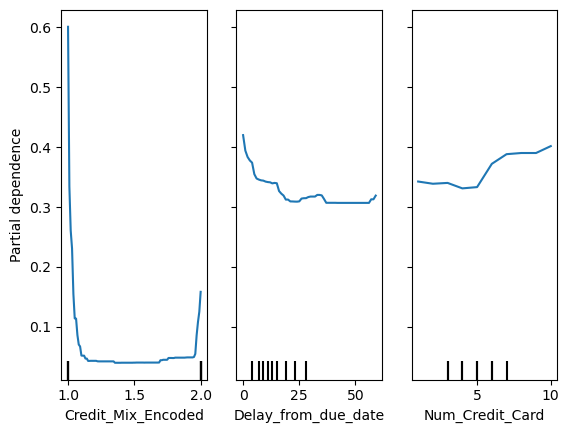

In [132]:
from sklearn.inspection import PartialDependenceDisplay

features = ['Credit_Mix_Encoded', 'Delay_from_due_date', 'Num_Credit_Card']
PartialDependenceDisplay.from_estimator(catboost_model, X_test_smote, features=features,target=1)


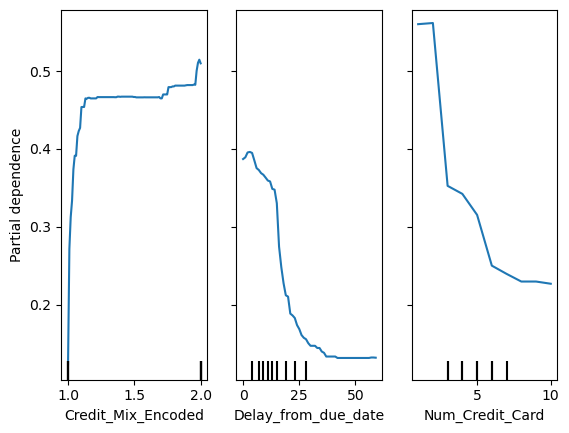

In [133]:
from sklearn.inspection import PartialDependenceDisplay

features = ['Credit_Mix_Encoded', 'Delay_from_due_date', 'Num_Credit_Card']
PartialDependenceDisplay.from_estimator(catboost_model, X_test_smote, features=features,target=2)


<a id="conclusion"></a>
## 7. ✅ Conclusion

## 7.1 🔐 KEY POINTS
<a id="KEY-POINTS"></a>

    KEY POINTS:

    
    Financial Stability Indicators: 
        Features such as 'Annual_Income', 'Num_Bank_Accounts', 'Num_Credit_Card', and 'Total_Num_Accounts' demonstrate positive correlations with each other and with the Credit score. This suggests that individuals with higher annual incomes or more diverse banking and credit card accounts tend to have higher credit scores.

    Debt-related Metrics: 
        'Debt_to_Income_Ratio' and 'Debt_Per_Account' exhibit negative correlations with the Credit score. This indicates that individuals with higher debt-to-income ratios or greater debt per account tend to have lower credit scores. Furthermore, 'Outstanding_Debt' demonstrates a weaker negative correlation with the credit score, highlighting its impact on overall creditworthiness.

    Credit Utilization and History: 
        'Total_EMI_per_month', representing monthly loan repayments, shows a positive correlation with the Credit score. Additionally, features related to credit history, such as 'Credit_History_Age_Months' and 'Credit_Mix_Encoded", suggests that individuals with longer credit histories, diverse credit accounts, and timely repayments tend to have higher credit scores.

    Loan-related Factors: 
        Features like 'Num_of_Loan' and 'Num_of_Delayed_Payment' indicate an individual's borrowing behavior and repayment patterns. This implies that individuals with fewer loan accounts or instances of delayed payments are more likely to have higher Credit scores.

    Interest Rate and Financial Behavior: 
        'Interest_Rate' reveals a relationship with the Credit score, suggesting that individuals with lower Interest rates on their loans may have higher Credit scores. Moreover, 'Changed_Credit_Limit' and 'Num_Credit_Inquiries' also exhibit correlations, reflecting changes in credit limits and the frequency of credit inquiries, respectively.

## 7.2 ☝️ TIPS
<a id="tips"></a>


        Here are some tips to help you maintain a good credit score ✅:
  


    Pay Your Bills on Time ⌚:
    
        Your payment history is one of the most significant factors in determining your credit score. Make sure to pay all your bills, including credit cards, loans, and utilities, on time to avoid late payments.
        
        
    Keep Your Credit Card Balances Low 🪙: 
    
        Try to keep your credit card balances low relative to your credit limit. High credit utilization ratios can negatively impact your credit score, so aim to keep your balances below 30% of your credit limit.


    Limit New Credit Applications 💳: 
    
        Every time you apply for new credit, a hard inquiry is recorded on your credit report, which can temporarily lower your score. Be selective about applying for new credit and only apply when necessary.
       
        
    Maintain a Mix of Credit Types 💹: 
    
        Having a diverse mix of credit types, such as credit cards, loans, and mortgages, can positively impact your credit score. However, don't open accounts you don't need just to improve your credit mix.


    Avoid Closing Old Accounts 💰: 
    
        Length of credit history is also a factor in your credit score. Closing old accounts can shorten your average account age and potentially lower your score. Keep your oldest accounts open and active, even if you're not using them regularly.